In [1]:
import pandas as pd
import numpy as np

In [2]:
from sklearn.preprocessing import LabelEncoder

# CLUSTERING BY RESIDUE

## Data Transformation

In [3]:
df = pd.read_csv('data/364_interaction_energies_state_function_v3.txt', sep='\t')

# find residues where interactions are made

# get columns with 'sum' in their name
sum_cols = [col for col in df.columns if 'sum' in col]

# create empty lists for column counts and residue numbers
int_counts = []
resnums = []

# loop through sum columns and count interactions that don't have nonzero energies
for col in sum_cols:
    resnum = col[:4]
    resnums.append(resnum)
    count = len(df.loc[(df[col] != 0) & (df[col].notnull())])
    int_counts.append(count)

#len([x for x in int_counts if x != 0])

# find columns where no interactions are made

non_int_resnums = []

for i in range(len(int_counts)):
    if int_counts[i] == 0:
        non_int_resnums.append(resnums[i])

# get list of interacting residues
# get columns with 'sum' in their name
sum_cols = [col for col in df.columns if 'sum' in col]

# create NEW empty lists for column counts and residue numbers
int_counts = []
int_resnums = []

for col in sum_cols:
    resnum = col[:4]
    if resnum not in non_int_resnums:
        int_resnums.append(resnum)
    
display(df)

,index,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,...,7.67_intenergysum,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2
0,1,7EW2,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,7EW3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,7EW4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,7EW1,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,7LD4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,387,5C1M,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
360,388,4EJ4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
361,389,4DKL,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
362,390,6Z10,Intermediate,Antagonist,0.0,None,0.0,None,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
len(non_int_resnums)

218

In [5]:
df.to_csv('df.csv')

In [6]:
# get residue numbers to serve as rows for new dataframe
resnums = []
cols = [col for col in df.columns if 'sum' in col]

for col in cols:
    resnum = col[:4]
    resnums.append(resnum)
    
#print(resnums)

In [7]:
# get list of PDBID values, states, functions
PDBIDs = list(df['PDBID'])
states = list(df['State'])
functions = list(df['Function'])
#PDBIDs

In [8]:
# generate column names for new dataframe
colnames = []

for PDBID in PDBIDs:
    colnames.append(PDBID + '_state') # new 5/17
    colnames.append(PDBID + '_function') # new 5/17
    colnames.append(PDBID + '_intenergysum')
    colnames.append(PDBID + '_inttype1')
    colnames.append(PDBID + '_intenergy1')
    colnames.append(PDBID + '_inttype2')
    colnames.append(PDBID + '_intenergy2')

In [9]:
colnames

['7EW2_state',
 '7EW2_function',
 '7EW2_intenergysum',
 '7EW2_inttype1',
 '7EW2_intenergy1',
 '7EW2_inttype2',
 '7EW2_intenergy2',
 '7EW3_state',
 '7EW3_function',
 '7EW3_intenergysum',
 '7EW3_inttype1',
 '7EW3_intenergy1',
 '7EW3_inttype2',
 '7EW3_intenergy2',
 '7EW4_state',
 '7EW4_function',
 '7EW4_intenergysum',
 '7EW4_inttype1',
 '7EW4_intenergy1',
 '7EW4_inttype2',
 '7EW4_intenergy2',
 '7EW1_state',
 '7EW1_function',
 '7EW1_intenergysum',
 '7EW1_inttype1',
 '7EW1_intenergy1',
 '7EW1_inttype2',
 '7EW1_intenergy2',
 '7LD4_state',
 '7LD4_function',
 '7LD4_intenergysum',
 '7LD4_inttype1',
 '7LD4_intenergy1',
 '7LD4_inttype2',
 '7LD4_intenergy2',
 '7LD3_state',
 '7LD3_function',
 '7LD3_intenergysum',
 '7LD3_inttype1',
 '7LD3_intenergy1',
 '7LD3_inttype2',
 '7LD3_intenergy2',
 '7RM5_state',
 '7RM5_function',
 '7RM5_intenergysum',
 '7RM5_inttype1',
 '7RM5_intenergy1',
 '7RM5_inttype2',
 '7RM5_intenergy2',
 '7M8W_state',
 '7M8W_function',
 '7M8W_intenergysum',
 '7M8W_inttype1',
 '7M8W_int

In [10]:
# create empty dataframe to fill with values from df
ml_df = pd.DataFrame()
ml_df['residue'] = resnums
temp_dict = {}

for colname in colnames:
    temp_dict[colname] = ['NA'] * len(resnums)

ml_df = pd.concat((ml_df, pd.DataFrame(temp_dict)), axis = 1)

In [11]:
ml_df = ml_df.copy()
import pickle
ml_df.to_pickle('ml_df_empty.pkl')

### Read Data

In [12]:
ml_df = pd.read_pickle('ml_df_empty.pkl')
display(ml_df)

,residue,7EW2_state,7EW2_function,7EW2_intenergysum,7EW2_inttype1,7EW2_intenergy1,7EW2_inttype2,7EW2_intenergy2,7EW3_state,7EW3_function,...,6Z10_intenergy1,6Z10_inttype2,6Z10_intenergy2,6RNK_state,6RNK_function,6RNK_intenergysum,6RNK_inttype1,6RNK_intenergy1,6RNK_inttype2,6RNK_intenergy2
0,1.21,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1,1.22,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2,1.23,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
3,1.24,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
4,1.25,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
328,7.65,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
329,7.66,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
330,7.67,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [13]:
for df_row in range(len(df)): # row represents df rows
    # get state and ligand function from the row, assign to separate variables
    state = df.loc[df_row, :].values.tolist()[2]
    function = df.loc[df_row, :].values.tolist()[3]
    
    # get state and function columns for each row
    
    # convert row to a flattened list, dropping the first 4 columns
    row_values = df.loc[df_row, :].values.tolist()[4:]
    # print(row_values, '\n')
    
    row_idx = 0 # row index
    col_idx = (df_row * 7) + 3 # start at col 1 for 1st entry, col 8 for 2nd entry, etc.
    col_end_idx = (df_row * 7) + 7
    
    for value in row_values:
        if col_idx > col_end_idx:
            row_idx += 1 # start on next row in ml_df
            col_idx = (df_row * 7) + 3 # reset column numbering
        ml_df.at[row_idx, ml_df.columns[col_idx]] = value # write new value to column col_idx of next row
        col_idx += 1

# fill in state/function columns for each PDBID
for PDBid in PDBIDs:
    state_col = PDBid + '_state'
    function_col = PDBid + '_function'
    
    ml_df.loc[:, state_col] = states[PDBIDs.index(PDBid)]
    ml_df.loc[:, function_col] = functions[PDBIDs.index(PDBid)]

In [14]:
ml_df.columns[1:]

Index(['7EW2_state', '7EW2_function', '7EW2_intenergysum', '7EW2_inttype1',
       '7EW2_intenergy1', '7EW2_inttype2', '7EW2_intenergy2', '7EW3_state',
       '7EW3_function', '7EW3_intenergysum',
       ...
       '6Z10_intenergy1', '6Z10_inttype2', '6Z10_intenergy2', '6RNK_state',
       '6RNK_function', '6RNK_intenergysum', '6RNK_inttype1',
       '6RNK_intenergy1', '6RNK_inttype2', '6RNK_intenergy2'],
      dtype='object', length=2548)

In [15]:
# # drop all columns except interaction energies
# # drop non 'intenergysum' columns
for col in ml_df.columns[1:]:
    if 'intenergysum' not in col:
        ml_df.drop([col], axis = 1, inplace = True)

In [16]:
# drop state/function columns
for col in ml_df.columns[1:]:
    if 'state' in col or 'function' in col:
        ml_df.drop([col], axis = 1, inplace = True)

In [17]:
display(ml_df)

,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,6ZA8_intenergysum,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum
0,1.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,1.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,1.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
3,1.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
328,7.65,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
329,7.66,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
330,7.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
# get unique interaction types
cols = [col for col in df.columns if 'type' in col]
int_types = []

for col in cols:
    for int_type in list(df[col].unique()):
        #print(type(int_type))
        if int_type not in int_types and int_type != 'None' and isinstance(int_type, str):
            int_types.append(int_type)
            
print(int_types)

['Hbond', 'Arene', 'Ionic', 'Distance', 'Covalent']


In [19]:
# pickle ml_df that is filled with data but not scaled or imputed
ml_df.to_pickle('ml_df_filled.pkl')

In [20]:
any("type" in s for s in list(ml_df.columns))

False

In [21]:
# encode interaction types as integers (only necessary if inttype1/2 columns are in the dataframe)

if any("type" in s for s in list(ml_df.columns)):
    
    # create instance of labelencoder
    labelencoder = LabelEncoder()

    # get columns with 'type' in their name
    cols = [col for col in ml_df.columns if 'type' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        ml_df[col] = labelencoder.fit_transform(ml_df[col])


    # encode states as integers
    # get columns with 'type' in their name
    cols = [col for col in ml_df.columns if 'state' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        ml_df[col] = labelencoder.fit_transform(ml_df[col])

    # encode functions as integers
    # get columns with 'type' in their name
    cols = [col for col in ml_df.columns if 'function' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        ml_df[col] = labelencoder.fit_transform(ml_df[col])

In [22]:
display(ml_df)

,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,6ZA8_intenergysum,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum
0,1.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,1.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,1.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
3,1.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
328,7.65,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
329,7.66,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
330,7.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
ml_df.to_csv('ml_df_test.csv')

---
# Machine Learning

In [24]:
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

In [25]:
# X has features, y has residues
X = ml_df.drop(['residue'], axis = 1)
y = ml_df['residue']
display(X)
ml_df_colnames = list(ml_df.columns)

,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,7EXD_intenergysum,...,6ZA8_intenergysum,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
328,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
329,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
ml_df_colnames

['residue',
 '7EW2_intenergysum',
 '7EW3_intenergysum',
 '7EW4_intenergysum',
 '7EW1_intenergysum',
 '7LD4_intenergysum',
 '7LD3_intenergysum',
 '7RM5_intenergysum',
 '7M8W_intenergysum',
 '7DB6_intenergysum',
 '7EXD_intenergysum',
 '7C4S_intenergysum',
 '7CX3_intenergysum',
 '7CX2_intenergysum',
 '7CX4_intenergysum',
 '7E32_intenergysum',
 '7E2Z_intenergysum',
 '7E2Y_intenergysum',
 '7E33_intenergysum',
 '7JOZ_intenergysum',
 '7ARO_intenergysum',
 '7DFL_intenergysum',
 '7CMV_intenergysum',
 '7CMU_intenergysum',
 '7CRH_intenergysum',
 '7CKX_intenergysum',
 '7CKW_intenergysum',
 '7CKY_intenergysum',
 '7JV5_intenergysum',
 '7JVQ_intenergysum',
 '7JVP_intenergysum',
 '7JVR_intenergysum',
 '7K15_intenergysum',
 '7L1V_intenergysum',
 '7DDZ_intenergysum',
 '7DFP_intenergysum',
 '7DHI_intenergysum',
 '7DHR_intenergysum',
 '7BU7_intenergysum',
 '7BU6_intenergysum',
 '7BVQ_intenergysum',
 '7BTS_intenergysum',
 '6LPJ_intenergysum',
 '6LPL_intenergysum',
 '6LPK_intenergysum',
 '6WQA_intenergysum'

In [27]:
# minimum energy
min(list(X.min()))

-39.702366

In [28]:
# impute data
from sklearn.impute import SimpleImputer
my_imputer = SimpleImputer()
X = pd.DataFrame(my_imputer.fit_transform(X))

# scale data
# scaler = StandardScaler()
# to_scale = [col for col in X.columns.values]
# scaler.fit(X[to_scale])
# X[to_scale] = scaler.transform(X[to_scale])

# # predict z-scores on the test set
# X[to_scale] = scaler.transform(X[to_scale]) 

# display scaled values
display(X)

,0,1,2,3,4,5,6,7,8,9,...,354,355,356,357,358,359,360,361,362,363
0,-0.046159,-0.042339,-0.008017,-0.019643,-0.035714,-0.041702,-0.033617,-0.016453,-0.000851,-0.104439,...,-0.132207,0.0,0.0,-0.000439,-0.001327,-0.10347,-0.086578,-0.101549,0.000000,0.000000
1,-0.046159,-0.042339,-0.008017,-0.019643,-0.035714,-0.041702,-0.033617,-0.016453,-0.000851,-0.104439,...,-0.132207,0.0,0.0,-0.000439,-0.001327,-0.10347,-0.086578,-0.101549,0.000000,0.000000
2,-0.046159,-0.042339,-0.008017,-0.019643,-0.035714,-0.041702,-0.033617,-0.016453,-0.000851,-0.104439,...,-0.132207,0.0,0.0,-0.000439,-0.001327,-0.10347,-0.086578,-0.101549,0.000000,0.000000
3,-0.046159,-0.042339,-0.008017,-0.019643,-0.035714,-0.041702,-0.033617,-0.016453,-0.000851,-0.104439,...,-0.132207,0.0,0.0,-0.000439,-0.001327,-0.10347,-0.086578,-0.101549,0.000000,0.000000
4,-0.046159,-0.042339,-0.008017,-0.019643,-0.035714,-0.041702,-0.033617,-0.016453,-0.000851,-0.104439,...,-0.132207,0.0,0.0,-0.000439,-0.001327,-0.10347,0.000000,-0.101549,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,-0.046159,-0.042339,0.000000,-0.019643,0.000000,0.000000,0.000000,-0.016453,-0.000851,-0.104439,...,-0.132207,0.0,0.0,-0.000439,-0.001327,-0.10347,-0.086578,-0.101549,-0.090614,-0.211884
328,-0.046159,-0.042339,0.000000,-0.019643,0.000000,0.000000,0.000000,-0.016453,-0.000851,-0.104439,...,-0.132207,0.0,0.0,-0.000439,-0.001327,-0.10347,-0.086578,-0.101549,-0.090614,-0.211884
329,-0.046159,-0.042339,0.000000,-0.019643,-0.035714,-0.041702,-0.033617,-0.016453,-0.000851,-0.104439,...,-0.132207,0.0,0.0,-0.000439,-0.001327,-0.10347,-0.086578,-0.101549,-0.090614,-0.211884
330,-0.046159,-0.042339,-0.008017,-0.019643,-0.035714,-0.041702,-0.033617,-0.016453,-0.000851,-0.104439,...,-0.132207,0.0,0.0,-0.000439,-0.001327,-0.10347,-0.086578,-0.101549,-0.090614,-0.211884


In [29]:
X.to_pickle('X_imputed_nonscaled_allresidues_intenergysums.pkl')
y.to_pickle('y_residues.pkl')

### Mean Shift Clustering

In [30]:
bandwidth = estimate_bandwidth(X, quantile=0.2, n_samples=len(X))

ms = MeanShift(bandwidth = bandwidth)
ms.fit(X)
labels = ms.labels_
cluster_centers = ms.cluster_centers_
 
labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)
 
# Print the number of clusters in the data
print("Clusters found: %d" % n_clusters_)

Clusters found: 45


In [31]:
ml_df['cluster_labels'] = labels

In [32]:
ml_df.to_csv('ml_df_meanshift_clustering_results.csv')

In [33]:
uniq_labels = list(ml_df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(ml_df.loc[ml_df['cluster_labels'] == i])


Cluster 0


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
0,1.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
1,1.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
2,1.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
3,1.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
4,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
328,7.65,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
329,7.66,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
330,7.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0



Cluster 1


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
301,7.38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1



Cluster 2


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
268,6.53,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2



Cluster 3


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
182,5.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3



Cluster 4


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
188,5.46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4



Cluster 5


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
161,4.60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5



Cluster 6


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
63,2.57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6



Cluster 7


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
56,2.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7



Cluster 8


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
18,1.39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.2,-4.6,8



Cluster 9


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
274,6.59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9



Cluster 10


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
273,6.58,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-0.9,0.0,0.0,0.0,10



Cluster 11


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
295,7.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11



Cluster 12


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
294,7.31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12



Cluster 13


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
67,2.61,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13



Cluster 14


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
309,7.46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14



Cluster 15


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
303,7.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15



Cluster 16


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
267,6.52,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16



Cluster 17


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
181,5.39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.1,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,17



Cluster 18


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
90,3.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,...,0.0,0.0,0.0,0.0,-18.149555,-14.874034,-19.628372,-0.4,-0.4,18



Cluster 19


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
69,2.63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.1,19



Cluster 20


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
184,5.42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.451371,0.0,...,0.0,0.0,0.0,0.0,-0.2,0.0,0.0,0.0,0.0,20



Cluster 21


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
298,7.35,0.0,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,0.0,21



Cluster 22


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
299,7.36,0.0,0.0,0.0,0.0,0.0,0.0,-0.3,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22



Cluster 23


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
269,6.54,0.0,0.0,0.0,0.0,0.0,0.0,-5.6,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23



Cluster 24


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
305,7.42,0.0,0.0,0.0,0.0,-0.1,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24



Cluster 25


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
180,5.38,0.0,0.0,0.0,0.0,-0.2,-1.0,-0.1,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25



Cluster 26


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
306,7.43,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.1,0.0,-0.2,0.0,0.0,26



Cluster 27


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
95,3.37,0.0,0.0,0.0,-0.2,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,27



Cluster 28


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
302,7.39,0.0,0.0,0.0,-0.2,0.0,-0.3,0.0,-0.1,0.0,...,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,-9.96928,-12.189508,28



Cluster 29


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
10,1.31,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-23.808136,29



Cluster 30


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
263,6.48,0.0,0.0,-0.1,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30



Cluster 31


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
185,5.43,0.0,0.0,-0.2,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31



Cluster 32


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
94,3.36,0.0,0.0,-0.3,-0.1,-0.2,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-2.1,-0.7,-0.7,0.0,0.0,32



Cluster 33


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
266,6.51,0.0,0.0,-0.3,-0.1,-1.2,-1.6,0.0,-1.4,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,33



Cluster 34


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
270,6.55,0.0,0.0,-0.4,-0.1,-6.1,-6.6,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.8,-1.7,-1.1,0.0,0.0,34



Cluster 35


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
66,2.60,0.0,-0.1,0.0,-1.8,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.3,0.0,0.0,-0.3,-0.7,35



Cluster 36


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
79,3.21,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,36



Cluster 37


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
177,5.35,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,37



Cluster 38


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
277,6.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38



Cluster 39


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
173,5.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,39



Cluster 40


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
91,3.33,-0.1,0.0,-0.5,0.0,-0.1,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.3,-0.6,-0.2,0.0,0.0,40



Cluster 41


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
71,2.65,-0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41



Cluster 42


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
86,3.28,-1.133249,-0.865499,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42



Cluster 43


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
70,2.64,-2.3,-0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.1,-5.3,43



Cluster 44


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
87,3.29,-6.744811,-8.58787,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.4,0.0,0.0,-0.6,-0.7,44


In [34]:
int_resnums

['1.27',
 '1.30',
 '1.31',
 '1.34',
 '1.35',
 '1.36',
 '1.38',
 '1.39',
 '1.42',
 '1.43',
 '2.39',
 '2.41',
 '2.45',
 '2.48',
 '2.50',
 '2.53',
 '2.54',
 '2.56',
 '2.57',
 '2.58',
 '2.59',
 '2.60',
 '2.61',
 '2.62',
 '2.63',
 '2.64',
 '2.65',
 '2.66',
 '2.67',
 '2.68',
 '3.21',
 '3.23',
 '3.24',
 '3.25',
 '3.26',
 '3.28',
 '3.29',
 '3.30',
 '3.32',
 '3.33',
 '3.34',
 '3.35',
 '3.36',
 '3.37',
 '3.39',
 '3.40',
 '3.41',
 '3.44',
 '3.45',
 '4.45',
 '4.46',
 '4.47',
 '4.50',
 '4.52',
 '4.54',
 '4.56',
 '4.57',
 '4.58',
 '4.60',
 '4.61',
 '4.64',
 '4.66',
 '5.31',
 '5.35',
 '5.36',
 '5.38',
 '5.39',
 '5.40',
 '5.41',
 '5.42',
 '5.43',
 '5.44',
 '5.45',
 '5.46',
 '5.47',
 '5.48',
 '5.49',
 '5.50',
 '5.53',
 '6.44',
 '6.45',
 '6.47',
 '6.48',
 '6.49',
 '6.50',
 '6.51',
 '6.52',
 '6.53',
 '6.54',
 '6.55',
 '6.57',
 '6.58',
 '6.59',
 '6.60',
 '6.61',
 '6.62',
 '7.28',
 '7.30',
 '7.31',
 '7.32',
 '7.33',
 '7.34',
 '7.35',
 '7.36',
 '7.37',
 '7.38',
 '7.39',
 '7.40',
 '7.41',
 '7.42',
 '7.43',
 

In [35]:
ml_df.drop(['cluster_labels'], axis = 1, inplace = True)

### K Means Clustering

In [36]:
from sklearn.cluster import KMeans
rng = 1

#### Silhouette Analysis

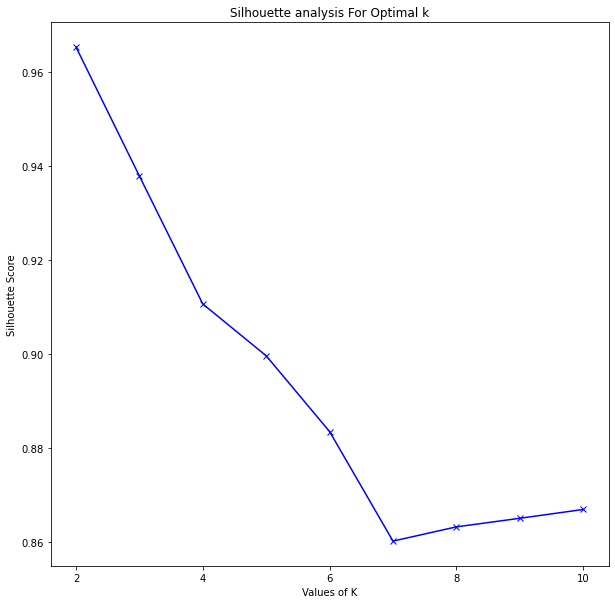

In [51]:
from matplotlib import pyplot as plt
from sklearn.metrics import silhouette_score

silhouette_avg = []
kmax = 10
for k in range(2, kmax+1):
    # initialise kmeans
    kmeans = KMeans(n_clusters=k, random_state = rng)
    kmeans.fit(X)
    cluster_labels = kmeans.labels_

    # silhouette score
    silhouette_avg.append(silhouette_score(X, cluster_labels))
    
plt.gcf().set_size_inches(10,10)
plt.gcf().set_dpi(72)   
plt.plot(list(range(2, kmax+1)),silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette Score') 
plt.xticks(range(2, kmax+1, 2))
plt.title('Silhouette analysis For Optimal k')
plt.show()

#### Elbow Method

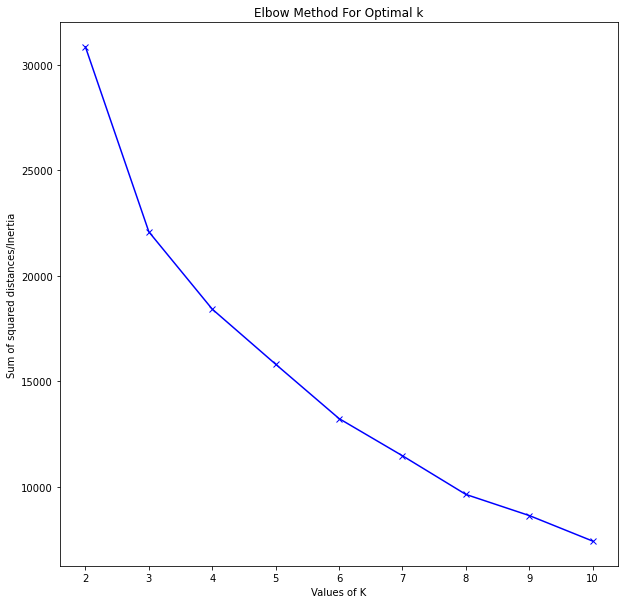

In [52]:
Sum_of_squared_distances = []
K = range(2,11)
for num_clusters in K :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(X)
    Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.gcf().set_size_inches(10,10)
plt.gcf().set_dpi(72)    
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.xticks(range(2, 11, 1))
plt.title('Elbow Method For Optimal k')
plt.show()

In [53]:
clustering = KMeans(n_clusters=2, random_state=rng)
clustering.fit(X)
labels = clustering.labels_
ml_df['cluster_labels'] = labels

In [54]:
ml_df.to_csv('ml_df_kmeans_clustering_results.csv')

In [55]:
uniq_labels = list(ml_df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(ml_df.loc[ml_df['cluster_labels'] == i])


Cluster 0


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
0,1.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
1,1.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
2,1.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
3,1.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
4,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
328,7.65,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
329,7.66,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
330,7.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0



Cluster 1


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
90,3.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,...,0.0,0.0,0.0,0.0,-18.149555,-14.874034,-19.628372,-0.4,-0.4,1


In [56]:
ml_df.drop(['cluster_labels'], axis = 1, inplace = True)

### Agglomerative Clustering

In [57]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
labels = cluster.fit_predict(X)
ml_df['cluster_labels'] = labels

In [58]:
ml_df.to_csv('ml_df_agglomerative_clustering_results.csv')

In [59]:
uniq_labels = list(ml_df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(ml_df.loc[ml_df['cluster_labels'] == i])


Cluster 0


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
0,1.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
1,1.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
2,1.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
3,1.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
4,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
328,7.65,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
329,7.66,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
330,7.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0



Cluster 1


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
90,3.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,...,0.0,0.0,0.0,0.0,-18.149555,-14.874034,-19.628372,-0.4,-0.4,1


In [60]:
ml_df.drop(['cluster_labels'], axis = 1, inplace = True)

### Gaussian Mixture Model

In [61]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=2)
labels = gmm.fit_predict(X)

In [62]:
ml_df['cluster_labels'] = labels

In [63]:
uniq_labels = list(ml_df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(ml_df.loc[ml_df['cluster_labels'] == i])


Cluster 0


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
0,1.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
1,1.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
2,1.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
3,1.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0
4,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
328,7.65,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
329,7.66,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
330,7.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0



Cluster 1


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
90,3.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,...,0.0,0.0,0.0,0.0,-18.149555,-14.874034,-19.628372,-0.4,-0.4,1


## TSNE (3 clusters)

In [56]:
plotX = X.copy()

#plotly imports
import plotly as py
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

#T-SNE with two principal components
TSNE_2d = TSNE(n_components=2, init='random')

clusters = ml_df['cluster_labels']
PCs_2d = pd.DataFrame(TSNE_2d.fit_transform(plotX))
PCs_2d.columns = ["PC1_2d", "PC2_2d"]
plotX['clusters'] = clusters
plotX['PC1_2d'] = PCs_2d['PC1_2d']
plotX['PC2_2d'] = PCs_2d['PC2_2d']

uniq_clusters = plotX['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

cluster0 = plotX[plotX['clusters'] == 0]
cluster1 = plotX[plotX['clusters'] == 1]
cluster2 = plotX[plotX['clusters'] == 2]

#trace1 is for 'Cluster 0'
trace1 = go.Scatter(
                    x = cluster0["PC1_2d"],
                    y = cluster0["PC2_2d"],
                    mode = "markers",
                    name = "Cluster I",
                    marker = dict(color = 'rgba(228,26,28,0.8)', size = 10, line=dict(width=1,color='Black')),
                    text = None)

#trace2 is for 'Cluster 1'
trace2 = go.Scatter(
                    x = cluster1["PC1_2d"],
                    y = cluster1["PC2_2d"],
                    mode = "markers",
                    name = "Cluster II",
                    marker = dict(color = 'rgba(43, 89, 39, 0.98)', size = 10, line=dict(width=1,color='Black')),
                    text = None)

#trace3 is for 'Cluster 2'
trace3 = go.Scatter(
                    x = cluster2["PC1_2d"],
                    y = cluster2["PC2_2d"],
                    mode = "markers",
                    name = "Cluster III",
                    marker = dict(color = 'rgba(20, 15, 71, 1)', size = 10, line=dict(width=1,color='Black')),
                    text = None)


data = [trace1, trace2, trace3]

layout = dict(xaxis= dict(title= 'Dimension 1',zeroline= False),
              yaxis= dict(title= 'Dimension 2',zeroline= False),
              font_family="Arial",
              font = dict(size=16),
              width=800,
              height=800
             )

fig = dict(data = data, layout = layout)

iplot(fig)

# CLUSTERING BY STRUCTURE

In [386]:
df = pd.read_csv('data/364_interaction_energies_state_function_v3.txt', sep='\t')
df.drop('index', axis = 1, inplace=True)
structure_df = df.copy()

In [387]:
# encode interaction types as integers (only necessary if inttype1/2 columns are in the dataframe)

if any("type" in s for s in list(ml_df.columns)):

    # create instance of labelencoder
    labelencoder = LabelEncoder()

    # get columns with 'type' in their name
    cols = [col for col in structure_df.columns if 'type' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        structure_df[col] = labelencoder.fit_transform(structure_df[col])


    # encode states as integers
    # get columns with 'type' in their name
    cols = [col for col in structure_df.columns if 'State' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        structure_df[col] = labelencoder.fit_transform(structure_df[col])

    # encode functions as integers
    # get columns with 'type' in their name
    cols = [col for col in structure_df.columns if 'Function' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        structure_df[col] = labelencoder.fit_transform(structure_df[col])

In [388]:
structure_df.columns

Index(['PDBID', 'State', 'Function', '1.21_intenergysum', '1.21_inttype1',
       '1.21_intenergy1', '1.21_inttype2', '1.21_intenergy2',
       '1.22_intenergysum', '1.22_inttype1',
       ...
       '7.67_intenergysum', '7.67_inttype1', '7.67_intenergy1',
       '7.67_inttype2', '7.67_intenergy2', '7.68_intenergysum',
       '7.68_inttype1', '7.68_intenergy1', '7.68_inttype2', '7.68_intenergy2'],
      dtype='object', length=1663)

In [389]:
# drop non-intenergysum columns
for col in structure_df.columns[1:]:
    if 'intenergysum' not in col:
        structure_df.drop(col, axis = 1, inplace = True)

In [390]:
structure_df

,PDBID,1.21_intenergysum,1.22_intenergysum,1.23_intenergysum,1.24_intenergysum,1.25_intenergysum,1.26_intenergysum,1.27_intenergysum,1.28_intenergysum,1.29_intenergysum,...,7.59_intenergysum,7.60_intenergysum,7.61_intenergysum,7.62_intenergysum,7.63_intenergysum,7.64_intenergysum,7.65_intenergysum,7.66_intenergysum,7.67_intenergysum,7.68_intenergysum
0,7EW2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,7EW3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,7EW4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
3,7EW1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7LD4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,5C1M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
360,4EJ4,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
361,4DKL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
362,6Z10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [391]:
X = structure_df.drop(['PDBID'], axis = 1)
y = structure_df['PDBID']
display(X)

,1.21_intenergysum,1.22_intenergysum,1.23_intenergysum,1.24_intenergysum,1.25_intenergysum,1.26_intenergysum,1.27_intenergysum,1.28_intenergysum,1.29_intenergysum,1.30_intenergysum,...,7.59_intenergysum,7.60_intenergysum,7.61_intenergysum,7.62_intenergysum,7.63_intenergysum,7.64_intenergysum,7.65_intenergysum,7.66_intenergysum,7.67_intenergysum,7.68_intenergysum
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
360,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
362,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [392]:
# get colnames
colnames = list(X.columns)

# impute data
from sklearn.impute import SimpleImputer
my_imputer = SimpleImputer(strategy='constant', fill_value=1)
X = pd.DataFrame(my_imputer.fit_transform(X))

# # scale data
# scaler = StandardScaler()
# to_scale = [col for col in X.columns.values]
# scaler.fit(X[to_scale])
# X[to_scale] = scaler.transform(X[to_scale])

# # predict z-scores on the test set
# X[to_scale] = scaler.transform(X[to_scale]) 

# #rename columns
X.columns = colnames

# display scaled values
display(X)

,1.21_intenergysum,1.22_intenergysum,1.23_intenergysum,1.24_intenergysum,1.25_intenergysum,1.26_intenergysum,1.27_intenergysum,1.28_intenergysum,1.29_intenergysum,1.30_intenergysum,...,7.59_intenergysum,7.60_intenergysum,7.61_intenergysum,7.62_intenergysum,7.63_intenergysum,7.64_intenergysum,7.65_intenergysum,7.66_intenergysum,7.67_intenergysum,7.68_intenergysum
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
360,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
361,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
362,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


### Mean Shift Clustering

In [393]:
bandwidth = estimate_bandwidth(X, quantile=0.2, n_samples=len(X))

ms = MeanShift(bandwidth = bandwidth)
ms.fit(X)
labels = ms.labels_
cluster_centers = ms.cluster_centers_
 
labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)
 
# Print the number of clusters in the data
print("Clusters found: %d" % n_clusters_)

Clusters found: 23


In [394]:
df['cluster_labels'] = labels

In [395]:
# display structures in each cluster
uniq_labels = list(df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(df.loc[df['cluster_labels'] == i])
    print(df.loc[df['cluster_labels'] == i]['State'].value_counts(), '\n')
    print(df.loc[df['cluster_labels'] == i]['Function'].value_counts())


Cluster 0


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
0,7EW2,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,7EW3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,7EW4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,7EW1,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,7LD4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,5T04,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
356,4XEE,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
357,4XES,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
358,4GRV,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


Inactive        133
Active           77
Intermediate      9
Other             1
Name: State, dtype: int64 

Antagonist           124
Agonist               87
Inverse agonist        6
Agonist (partial)      3
Name: Function, dtype: int64

Cluster 1


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
9,7EXD,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
14,7E32,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
15,7E2Z,Active,Agonist (partial),NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
16,7E2Y,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
21,7CMV,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,2VT4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
347,6IQL,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
359,5C1M,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
360,4EJ4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


Inactive        62
Active          33
Intermediate     7
Name: State, dtype: int64 

Agonist              46
Antagonist           38
Inverse agonist      13
Agonist (partial)     5
Name: Function, dtype: int64

Cluster 2


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
11,7CX3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
13,7CX4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
133,6IIV,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
135,6AK3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2


Active          3
Intermediate    1
Name: State, dtype: int64 

Agonist       3
Antagonist    1
Name: Function, dtype: int64

Cluster 3


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
12,7CX2,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
132,6IIU,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
136,6M9T,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
137,5YHL,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
138,5YWY,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3


Active          2
Inactive        2
Intermediate    1
Name: State, dtype: int64 

Antagonist    3
Agonist       2
Name: Function, dtype: int64

Cluster 4


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
6,7RM5,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
349,6Z4Q,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
351,6Z8N,Intermediate,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
352,6ZIN,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4


Inactive        3
Intermediate    1
Name: State, dtype: int64 

Inverse agonist    2
Antagonist         1
Agonist            1
Name: Function, dtype: int64

Cluster 5


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
86,6RZ8,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
87,6RZ6,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
88,6RZ9,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
89,6RZ7,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5


Intermediate    4
Name: State, dtype: int64 

Antagonist    4
Name: Function, dtype: int64

Cluster 6


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
53,6KO5,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
299,7S8P,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
306,7NA8,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6


Active      2
Inactive    1
Name: State, dtype: int64 

Agonist       2
Antagonist    1
Name: Function, dtype: int64

Cluster 7


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
168,5OLZ,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
171,5OM1,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
172,5OM4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7


Inactive    3
Name: State, dtype: int64 

Antagonist    3
Name: Function, dtype: int64

Cluster 8


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
159,5ZBH,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8
287,7VDH,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8


Inactive    1
Active      1
Name: State, dtype: int64 

Antagonist    1
Agonist       1
Name: Function, dtype: int64

Cluster 9


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
255,3V2Y,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
256,3V2W,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9


Inactive    2
Name: State, dtype: int64 

Antagonist    2
Name: Function, dtype: int64

Cluster 10


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
10,7C4S,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10


Active    1
Name: State, dtype: int64 

Agonist    1
Name: Function, dtype: int64

Cluster 11


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
192,5TZR,Intermediate,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11
234,4PHU,Intermediate,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11


Intermediate    2
Name: State, dtype: int64 

Agonist    2
Name: Function, dtype: int64

Cluster 12


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
235,4PY0,Intermediate,Agonist (partial),NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12


Intermediate    1
Name: State, dtype: int64 

Agonist (partial)    1
Name: Function, dtype: int64

Cluster 13


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
236,4PXZ,Intermediate,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13


Intermediate    1
Name: State, dtype: int64 

Agonist    1
Name: Function, dtype: int64

Cluster 14


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
226,4Z36,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14


Inactive    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64

Cluster 15


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
304,7F8U,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15


Inactive    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64

Cluster 16


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
296,7VV6,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16
297,7S8N,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16


Active    2
Name: State, dtype: int64 

Agonist    2
Name: Function, dtype: int64

Cluster 17


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
158,5ZBQ,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17


Inactive    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64

Cluster 18


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
350,6Z4S,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18


Inactive    1
Name: State, dtype: int64 

Inverse agonist    1
Name: Function, dtype: int64

Cluster 19


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
354,6ZA8,Intermediate,Agonist (partial),NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19


Intermediate    1
Name: State, dtype: int64 

Agonist (partial)    1
Name: Function, dtype: int64

Cluster 20


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
348,5X33,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20


Inactive    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64

Cluster 21


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
108,6K1Q,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21


Inactive    1
Name: State, dtype: int64 

Inverse agonist    1
Name: Function, dtype: int64

Cluster 22


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
363,6RNK,Intermediate,Antagonist,0.0,None,0.0,None,0.0,0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22


Intermediate    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64


#### Plotting Heatmap Sorted by Mean Shift Clustering Results

In [396]:
import pickle

# get protein names from pickled file
with open('protein_names.pkl', "rb") as f:
    protein_names = pickle.load(f)    

# assign variable containing PDB IDs for all structures
PDBids = y

# assign variable with states for all structures
states = df['State']

In [397]:
# generate name/state/function labels
protein_NSF = []
for i in range(len(df)):
    name = protein_names[i]
    state = df.iloc[i, 1]
    function = df.iloc[i, 2]
    NSF = name + ' (' + state + ', ' + function + ')'
    protein_NSF.append(NSF)

In [398]:
# generate name/PDBID labels
protein_NPDB = []
for i in range(len(df)):
    name = protein_names[i]
    PDB = PDBids[i]
    NPDB = name + ' (' + PDB + ')'
    protein_NPDB.append(NPDB)

In [399]:
# determine where to place row lines
uniqs = np.unique(ms.labels_, return_counts=True)
line_count = 0
row_line_markers = []
for i in list(uniqs[1]):
    line_count += i
    row_line_markers.append(line_count)
    #print(line_count)
    
print(row_line_markers)

[220, 322, 326, 331, 335, 339, 342, 345, 347, 349, 350, 352, 353, 354, 355, 356, 358, 359, 360, 361, 362, 363, 364]


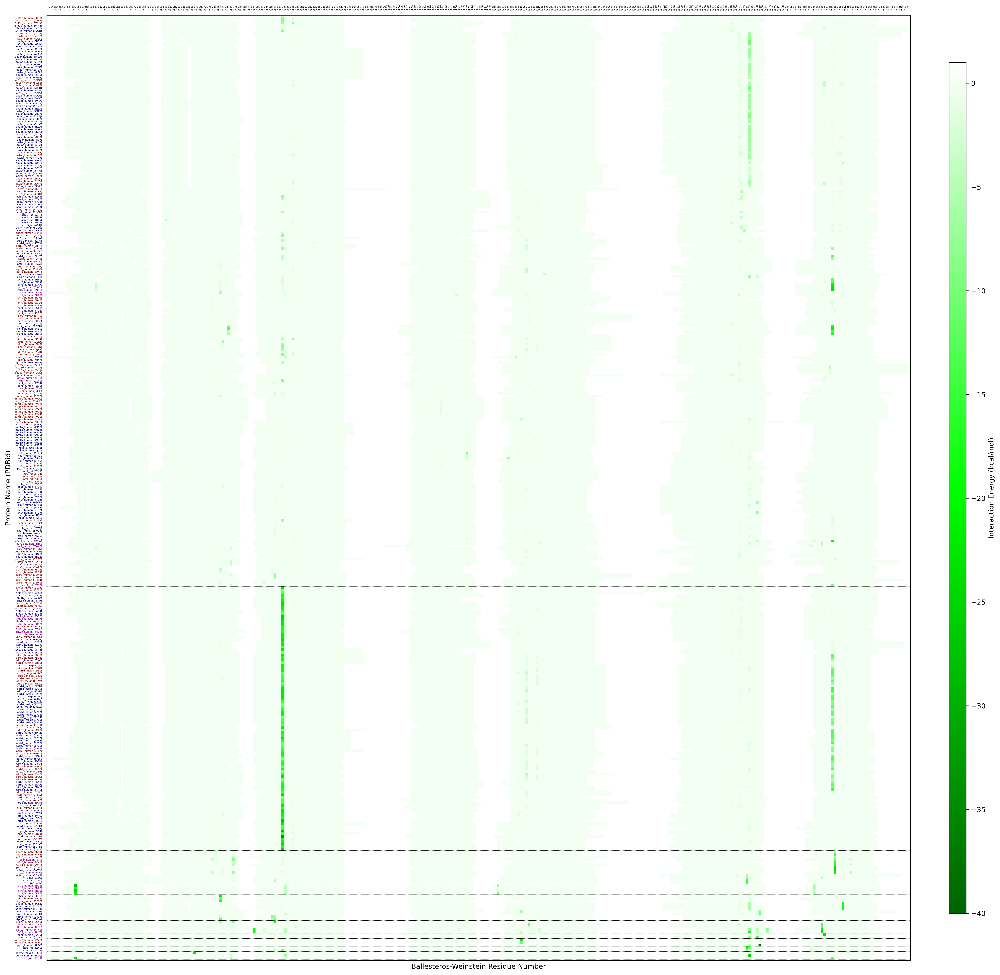

In [400]:
# plot cluster heatmap (all residues)

#imports
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# copy X to plotX, sort by cluster labels then protein names
plotX = X.copy()
plotX['PDBID'] = PDBids
plotX['protein_names'] = protein_names
plotX['cluster_labels'] = labels
plotX['protein_NPDB'] = protein_NPDB
plotX['states'] = states
plotX.sort_values(by = ['cluster_labels', 'protein_names'], ascending = [True, True], na_position = 'first', inplace = True)
plotX.reset_index(inplace = True)
plotX.drop(['index'], axis = 1, inplace = True)

X_mat = plotX.drop(['PDBID', 'protein_names', 'cluster_labels', 'protein_NPDB', 'states'], axis = 1)

# convert some variables to numpy arrays for sorting
structure_df_np = structure_df.to_numpy()
X_mat_np = X_mat.to_numpy()
PDBids_np = np.array(PDBids)
resnums_np = np.array(resnums)
protein_names_np = np.array(protein_names)

# normalization and colormap
norm = plt.Normalize(-40,1)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

# plotting
fig = plt.figure(figsize=(25, 25), dpi = 300)
ax = fig.add_subplot(111)
cax = ax.matshow(X_mat, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90)
plt.yticks(np.arange(len(y)), list(plotX['protein_NPDB']), fontsize = 3.5)
plt.xticks(np.arange(len(X_mat.columns)), resnums, fontsize = 3.5, rotation = 90)
plt.xlim([-1,len(resnums)])
plt.ylim([-1,len(PDBids)])
plt.xlabel("Ballesteros-Weinstein Residue Number")
plt.ylabel("Protein Name (PDBid)")
plt.gca().invert_yaxis()


# row lines
for i in row_line_markers:
     plt.axhline(y = i - 0.5, color='black', linestyle='dashed', linewidth = 0.25)


# remove tick marks, keep labels        
plt.gca().tick_params(
    axis='both',          # changes apply to both axes
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelbottom=False) # labels along the bottom edge are off

# color tick labels by activation state
for i in range(len(plotX['states'])):
    #print(i, plotX['PDBID'][i], plotX['states'][i])
    if plotX['states'][i] == 'Active':
        plt.gca().get_yticklabels()[i].set_color("maroon")
    elif plotX['states'][i] == 'Inactive':
        plt.gca().get_yticklabels()[i].set_color("navy")
    elif plotX['states'][i] == 'Intermediate':
        plt.gca().get_yticklabels()[i].set_color("darkmagenta")
    elif plotX['states'][i] == 'Other':
        plt.gca().get_yticklabels()[i].set_color("black")
        
plt.show()

In [401]:
X_mat.to_csv('X_mat.csv')

In [402]:
# create new variables for plot data, plot resnums
X_mat_int = X_mat.copy()
plot_int_resnums = resnums.copy()

for col in X_mat_int.columns:
    if X_mat_int[col].min() == 0:
        X_mat_int.drop(col, axis = 1, inplace = True)
        plot_int_resnums.remove(col[0:4])
        

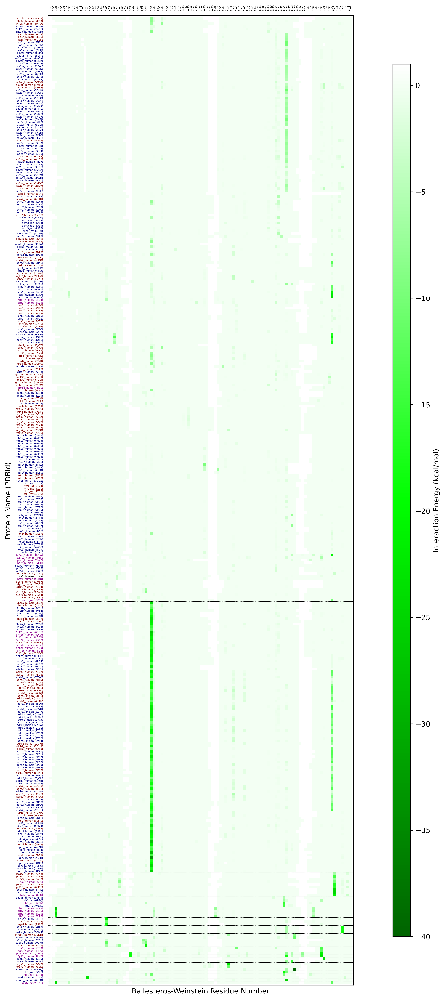

In [403]:
# plot cluster heatmap (interacting residues)

#imports
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap


# matplotlib.rcParams['figure.figsize'] = [25, 25] #width, height (both in inches)
# matplotlib.rcParams['figure.dpi'] = 300 #width, height (both in inches)

# normalization and colormap
norm = plt.Normalize(-40,1)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

# plotting
fig = plt.figure(figsize=(25, 25), dpi = 300)
ax = fig.add_subplot(111)
cax = ax.matshow(X_mat_int, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90)
plt.yticks(np.arange(len(y)), list(plotX['protein_NPDB']), fontsize = 3.5)
plt.xticks(np.arange(len(X_mat_int.columns)), plot_int_resnums, fontsize = 3.5, rotation = 90)
plt.xlim([-1,len(plot_int_resnums)])
plt.ylim([-1,len(PDBids)])
plt.xlabel("Ballesteros-Weinstein Residue Number")
plt.ylabel("Protein Name (PDBid)")
plt.gca().invert_yaxis()

# row lines
for i in row_line_markers:
     plt.axhline(y = i - 0.5, color='black', linestyle='dashed', linewidth = 0.25)


        
plt.gca().tick_params(
    axis='both',          # changes apply to both axes
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelbottom=False) # labels along the bottom edge are off

# color tick labels by activation state
for i in range(len(plotX['states'])):
    if plotX['states'][i] == 'Active':
        plt.gca().get_yticklabels()[i].set_color("maroon")
    elif plotX['states'][i] == 'Inactive':
        plt.gca().get_yticklabels()[i].set_color("navy")
    elif plotX['states'][i] == 'Intermediate':
        plt.gca().get_yticklabels()[i].set_color("darkmagenta")
    elif plotX['states'][i] == 'Other':
        plt.gca().get_yticklabels()[i].set_color("black")
        
plt.show()

Cluster: 0


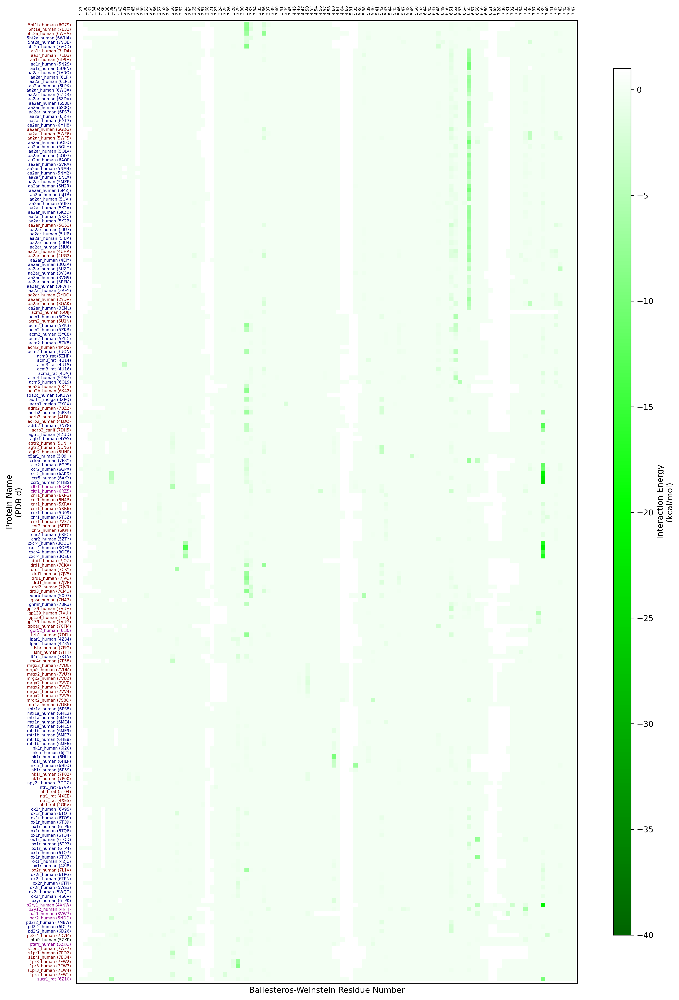

Cluster: 1


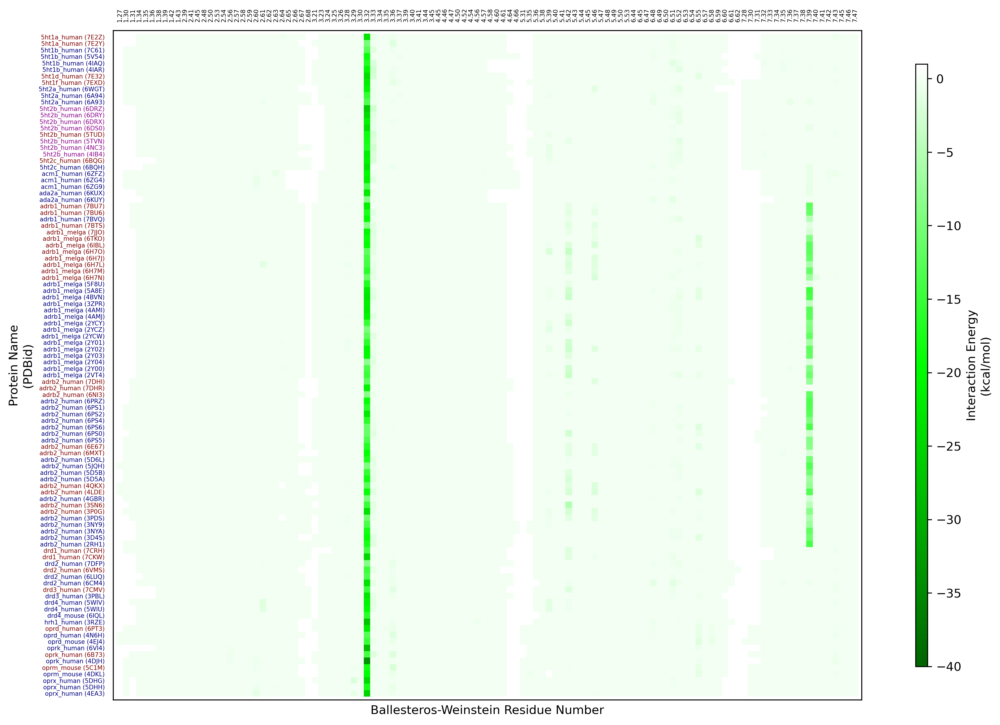

Cluster: 2


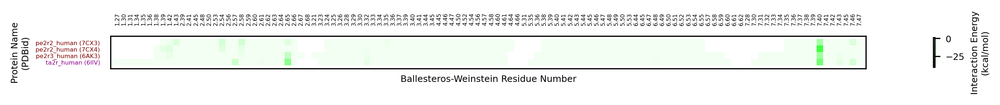

Cluster: 3


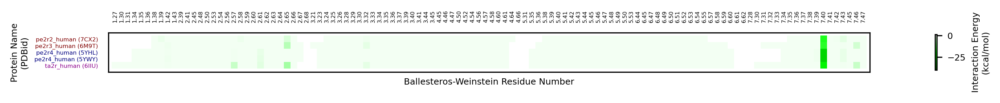

Cluster: 4


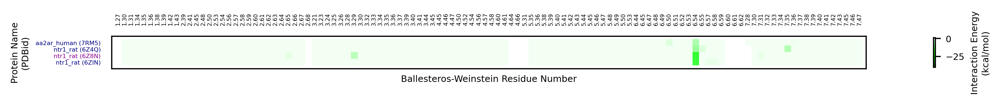

Cluster: 5


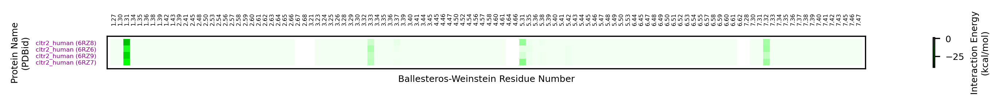

Cluster: 6


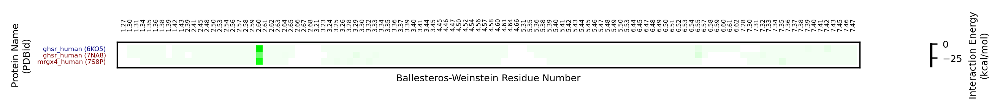

Cluster: 7


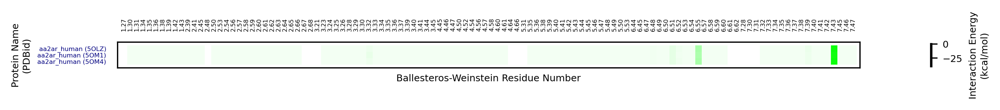

Cluster: 8


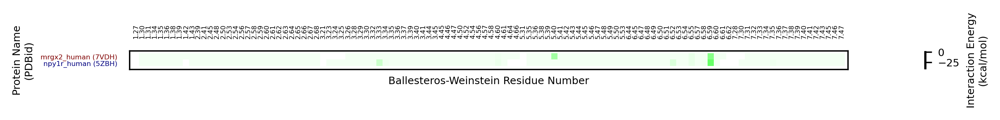

Cluster: 9


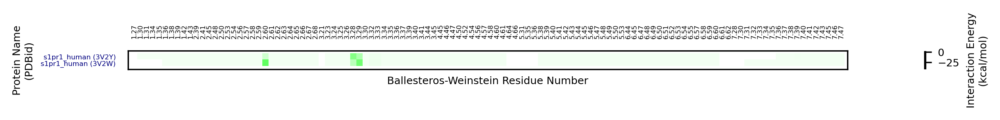

Cluster: 10


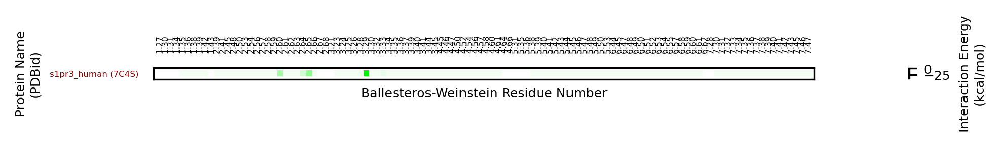

Cluster: 11


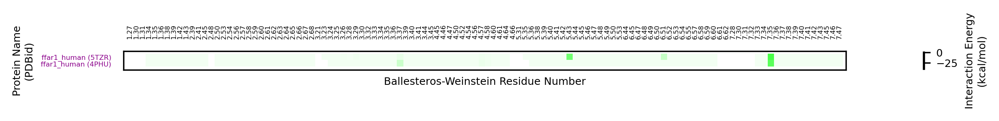

Cluster: 12


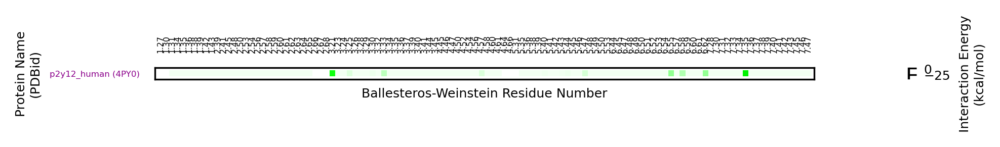

Cluster: 13


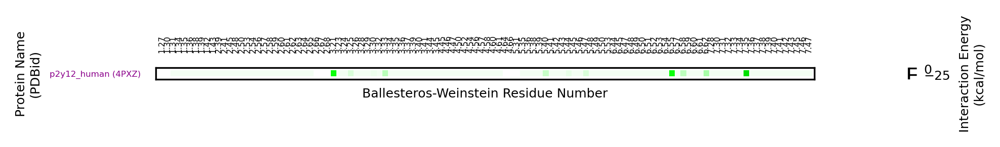

Cluster: 14


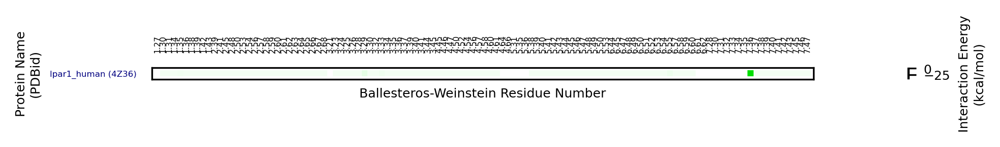

Cluster: 15


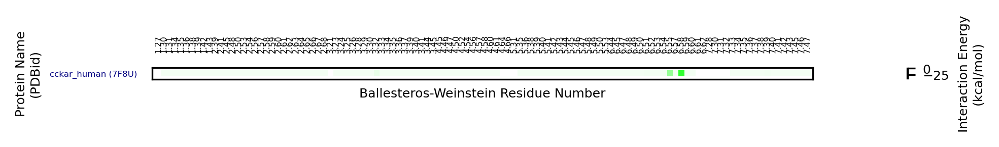

Cluster: 16


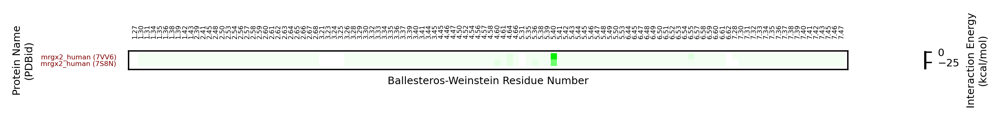

Cluster: 17


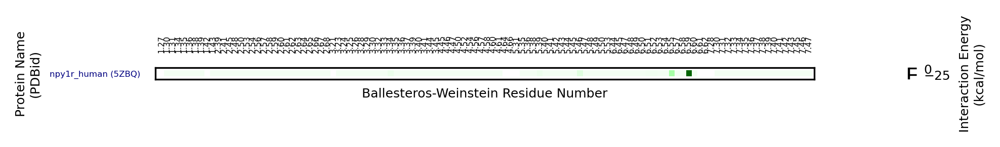

Cluster: 18


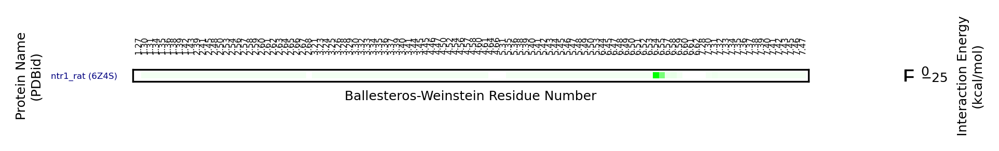

Cluster: 19


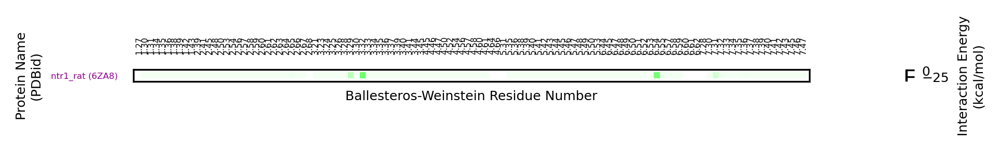

Cluster: 20


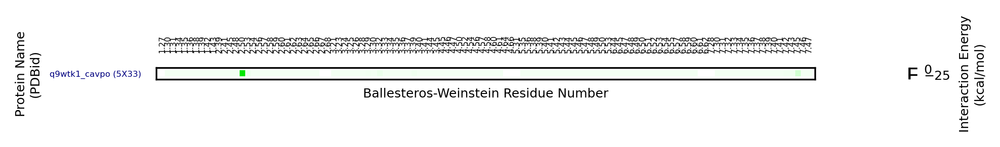

Cluster: 21


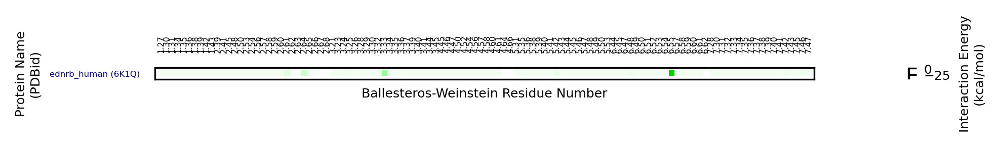

Cluster: 22


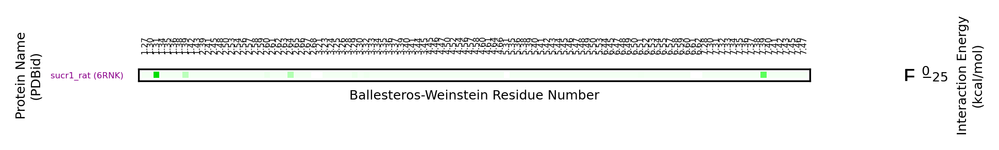

In [422]:
plt.close()
for i in range(len(row_line_markers)):
    x_labels = list(plotX['protein_NPDB'])
    plot_states = list(plotX['states'])
    
    print('Cluster:', i)
    # get data by cluster
    if i == 0:
        sub_X_mat_int = X_mat_int.iloc[0:row_line_markers[i], :]
        sub_x_labels = x_labels[0:row_line_markers[i]]
        sub_plot_states = plot_states[0:row_line_markers[i]]
    elif i == max(range(len(row_line_markers))):
        sub_X_mat_int = X_mat_int.iloc[row_line_markers[i] - 1:, :]
        sub_x_labels = x_labels[row_line_markers[i] - 1:]
        sub_plot_states = plot_states[row_line_markers[i] - 1:]
    else:
        sub_X_mat_int = X_mat_int.iloc[row_line_markers[i-1]:row_line_markers[i], :]
        sub_x_labels = x_labels[row_line_markers[i-1]:row_line_markers[i]]
        sub_plot_states = plot_states[row_line_markers[i-1]:row_line_markers[i]]
    
#     matplotlib.rcParams['figure.figsize'] = [25, 25] #width, height (both in inches)
#     matplotlib.rcParams['figure.dpi'] = 300 #width, height (both in inches)


    # normalization and colormap
    norm = plt.Normalize(-40,1)
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

    # plotting
    fig = plt.figure(figsize=(20,len(sub_X_mat_int) / 10))
    ax = fig.add_subplot(111)
    cax = ax.matshow(sub_X_mat_int, cmap=cmap, norm=norm)
    ratio = X.shape[0]/X.shape[1]
    if len(sub_X_mat_int) < 10:
        plt.yticks(np.arange(len(sub_x_labels)), sub_x_labels, fontsize = 4)
        plt.xticks(np.arange(len(sub_X_mat_int.columns)), plot_int_resnums, fontsize = 3.75, rotation = 90)
        plt.xlabel("Ballesteros-Weinstein Residue Number", fontsize = 6)
        plt.ylabel("Protein Name\n(PDBid)", fontsize = 6)
        plt.ylabel("Protein Name\n(PDBid)", fontsize = 6)
        cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, shrink = 0.9)
        cbar.set_label('Interaction Energy\n(kcal/mol)', rotation=90, fontsize = 6)
        cbar.ax.tick_params(labelsize=6)
    else:
        plt.yticks(np.arange(len(sub_x_labels)), sub_x_labels, fontsize = 5)
        plt.xticks(np.arange(len(sub_X_mat_int.columns)), plot_int_resnums, fontsize = 5, rotation = 90)
        plt.xlabel("Ballesteros-Weinstein Residue Number", fontsize = 10)
        plt.ylabel("Protein Name\n(PDBid)", fontsize = 10)
        cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
        cbar.set_label('Interaction Energy\n(kcal/mol)', rotation=90)
    plt.xlim([-1,len(plot_int_resnums)])
    plt.ylim([-1,len(sub_x_labels)])
    plt.gca().invert_yaxis()

    plt.gca().tick_params(
        axis='both',          # changes apply to both axes
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        left=False,
        right=False,
        labelbottom=False) # labels along the bottom edge are off

    # color tick labels by activation state
    for i in range(len(sub_plot_states)):
        if sub_plot_states[i] == 'Active':
            plt.gca().get_yticklabels()[i].set_color("maroon")
        elif sub_plot_states[i] == 'Inactive':
            plt.gca().get_yticklabels()[i].set_color("navy")
        elif sub_plot_states[i] == 'Intermediate':
            plt.gca().get_yticklabels()[i].set_color("darkmagenta")
        elif sub_plot_states[i] == 'Other':
            plt.gca().get_yticklabels()[i].set_color("black")    

    plt.show()
    plt.close()

### K-means Clustering

In [423]:
from sklearn.cluster import KMeans
rng = 1

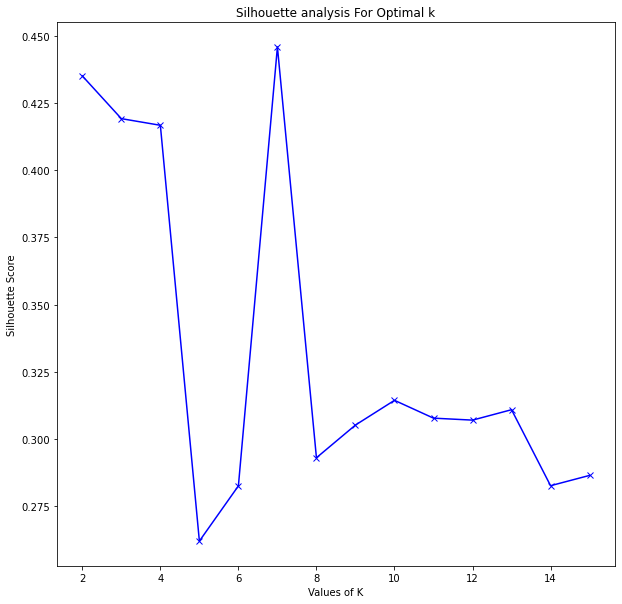

In [426]:
from sklearn.metrics import silhouette_score

silhouette_avg = []
kmax = 15
for k in range(2, kmax+1):
    # initialise kmeans
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    cluster_labels = kmeans.labels_

    # silhouette score
    silhouette_avg.append(silhouette_score(X, cluster_labels))
    
plt.gcf().set_size_inches(10,10)
plt.gcf().set_dpi(72)   
plt.plot(list(range(2, kmax+1)),silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette Score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

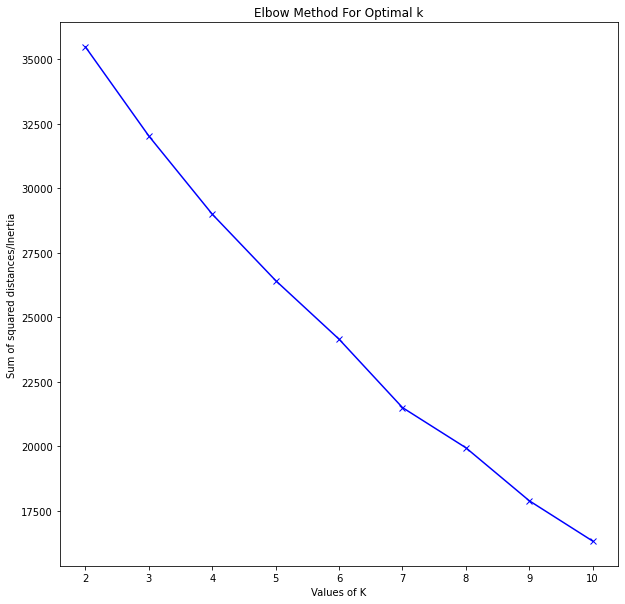

In [431]:
Sum_of_squared_distances = []
K = range(2,11)
for num_clusters in K :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(X)
    Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.gcf().set_size_inches(10,10)
plt.gcf().set_dpi(72)    
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

In [432]:
clustering = KMeans(n_clusters=7, random_state=rng)
clustering.fit(X)
labels = clustering.labels_
df['cluster_labels'] = labels

In [434]:
# display structures in each cluster
uniq_labels = list(df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(df.loc[df['cluster_labels'] == i])
    print(df.loc[df['cluster_labels'] == i]['State'].value_counts(), '\n')
    print(df.loc[df['cluster_labels'] == i]['Function'].value_counts())


Cluster 0


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
35,7DHI,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
37,7BU7,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
38,7BU6,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
94,6NI3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
96,6PRZ,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
97,6PS1,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
98,6PS2,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
99,6PS4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
100,6PS6,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
102,6PS5,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


Inactive    26
Active      16
Name: State, dtype: int64 

Agonist              19
Antagonist           12
Inverse agonist       9
Agonist (partial)     2
Name: Function, dtype: int64

Cluster 1


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
0,7EW2,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,7EW3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,7EW4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,7EW1,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
6,7RM5,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,6YVR,Inactive,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
355,5T04,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
356,4XEE,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
357,4XES,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


Inactive        91
Active          67
Intermediate    12
Other            1
Name: State, dtype: int64 

Antagonist           83
Agonist              79
Inverse agonist       7
Agonist (partial)     2
Name: Function, dtype: int64

Cluster 2


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
9,7EXD,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
14,7E32,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
15,7E2Z,Active,Agonist (partial),NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
25,7CKW,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
36,7DHR,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
39,7BVQ,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
49,6WGT,Inactive,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
63,6VI4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
90,6PT3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
91,6KUX,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2


Inactive        23
Active          11
Intermediate     7
Name: State, dtype: int64 

Agonist              19
Antagonist           18
Inverse agonist       3
Agonist (partial)     1
Name: Function, dtype: int64

Cluster 3


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
16,7E2Y,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
17,7E33,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
20,7DFL,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
21,7CMV,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
22,7CMU,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
23,7CRH,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
24,7CKX,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
27,7JV5,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
28,7JVQ,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
29,7JVP,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3


Inactive        18
Active          17
Intermediate     1
Name: State, dtype: int64 

Agonist              19
Antagonist           12
Agonist (partial)     4
Inverse agonist       1
Name: Function, dtype: int64

Cluster 4


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
130,6GPS,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
131,6GPX,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
145,6AKX,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
146,6AKY,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
231,4XNW,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
244,4MBS,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
271,3ODU,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
272,3OE9,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
273,3OE8,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
274,3OE6,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4


Inactive        10
Intermediate     2
Name: State, dtype: int64 

Antagonist         11
Inverse agonist     1
Name: Function, dtype: int64

Cluster 5


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
86,6RZ8,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
87,6RZ6,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
88,6RZ9,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
89,6RZ7,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
363,6RNK,Intermediate,Antagonist,0.0,None,0.0,None,0.0,0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5


Intermediate    5
Name: State, dtype: int64 

Antagonist    5
Name: Function, dtype: int64

Cluster 6


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
4,7LD4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
5,7LD3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
41,6LPJ,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
42,6LPL,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
43,6LPK,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
44,6WQA,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
50,6ZDR,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
57,6S0L,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
58,6S0Q,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
95,6PS7,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6


Inactive        45
Active          10
Intermediate     2
Name: State, dtype: int64 

Antagonist           42
Agonist              12
Inverse agonist       2
Agonist (partial)     1
Name: Function, dtype: int64


In [436]:
# determine where to place row lines
uniqs = np.unique(clustering.labels_, return_counts=True)
line_count = 0
row_line_markers = []
for i in list(uniqs[1]):
    line_count += i
    row_line_markers.append(line_count)
    #print(line_count)
    
print(row_line_markers)

[42, 213, 254, 290, 302, 307, 364]


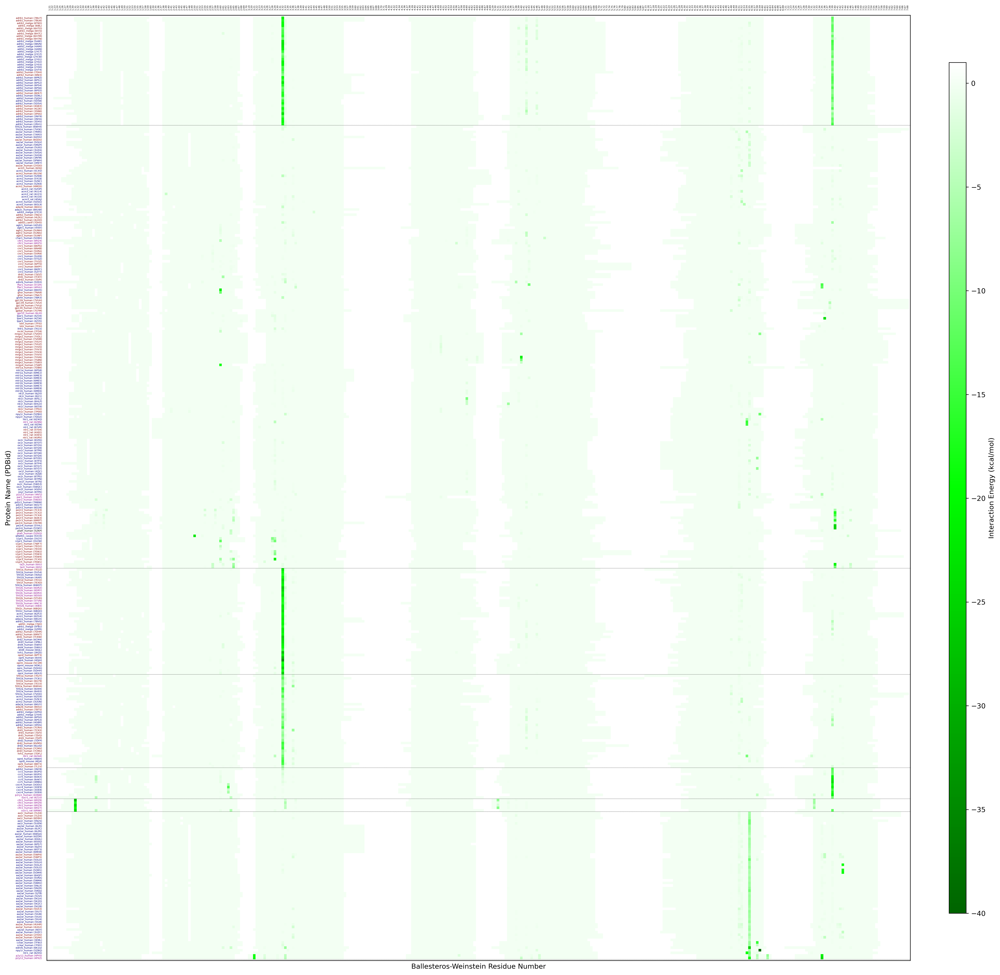

In [437]:
# plot cluster heatmap (all residues)

#imports
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# copy X to plotX, sort by cluster labels then protein names
plotX = X.copy()
plotX['PDBID'] = PDBids
plotX['protein_names'] = protein_names
plotX['cluster_labels'] = labels
plotX['protein_NPDB'] = protein_NPDB
plotX['states'] = states
plotX.sort_values(by = ['cluster_labels', 'protein_names'], ascending = [True, True], na_position = 'first', inplace = True)
plotX.reset_index(inplace = True)
plotX.drop(['index'], axis = 1, inplace = True)

X_mat = plotX.drop(['PDBID', 'protein_names', 'cluster_labels', 'protein_NPDB', 'states'], axis = 1)

# convert some variables to numpy arrays for sorting
structure_df_np = structure_df.to_numpy()
X_mat_np = X_mat.to_numpy()
PDBids_np = np.array(PDBids)
resnums_np = np.array(resnums)
protein_names_np = np.array(protein_names)

# normalization and colormap
norm = plt.Normalize(-40,1)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

# plotting
fig = plt.figure(figsize=(25, 25), dpi = 300)
ax = fig.add_subplot(111)
cax = ax.matshow(X_mat, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90)
plt.yticks(np.arange(len(y)), list(plotX['protein_NPDB']), fontsize = 3.5)
plt.xticks(np.arange(len(X_mat.columns)), resnums, fontsize = 3.5, rotation = 90)
plt.xlim([-1,len(resnums)])
plt.ylim([-1,len(PDBids)])
plt.xlabel("Ballesteros-Weinstein Residue Number")
plt.ylabel("Protein Name (PDBid)")
plt.gca().invert_yaxis()


# row lines
for i in row_line_markers:
     plt.axhline(y = i - 0.5, color='black', linestyle='dashed', linewidth = 0.25)


# remove tick marks, keep labels        
plt.gca().tick_params(
    axis='both',          # changes apply to both axes
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelbottom=False) # labels along the bottom edge are off

# color tick labels by activation state
for i in range(len(plotX['states'])):
    #print(i, plotX['PDBID'][i], plotX['states'][i])
    if plotX['states'][i] == 'Active':
        plt.gca().get_yticklabels()[i].set_color("maroon")
    elif plotX['states'][i] == 'Inactive':
        plt.gca().get_yticklabels()[i].set_color("navy")
    elif plotX['states'][i] == 'Intermediate':
        plt.gca().get_yticklabels()[i].set_color("darkmagenta")
    elif plotX['states'][i] == 'Other':
        plt.gca().get_yticklabels()[i].set_color("black")
        
plt.show()

In [438]:
# create new variables for plot data, plot resnums
X_mat_int = X_mat.copy()
plot_int_resnums = resnums.copy()

for col in X_mat_int.columns:
    if X_mat_int[col].min() == 0:
        X_mat_int.drop(col, axis = 1, inplace = True)
        plot_int_resnums.remove(col[0:4])
        

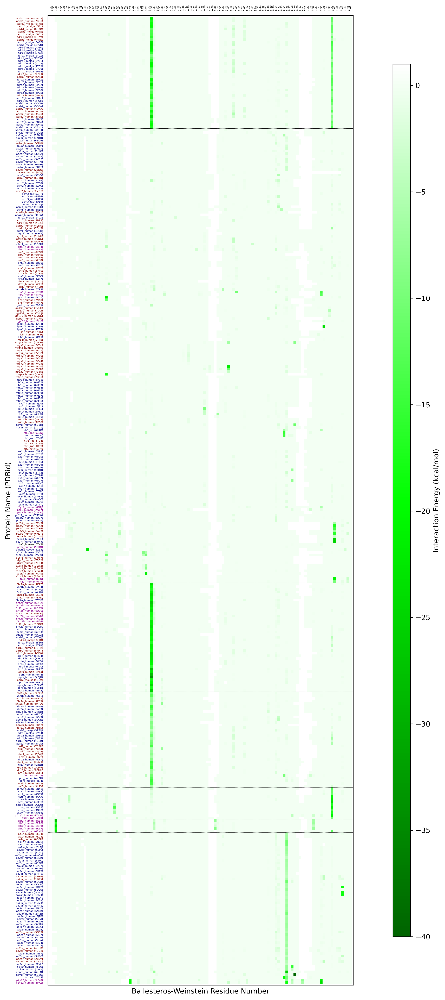

In [439]:
# plot cluster heatmap (interacting residues)

#imports
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap


# matplotlib.rcParams['figure.figsize'] = [25, 25] #width, height (both in inches)
# matplotlib.rcParams['figure.dpi'] = 300 #width, height (both in inches)

# normalization and colormap
norm = plt.Normalize(-40,1)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

# plotting
fig = plt.figure(figsize=(25, 25), dpi = 300)
ax = fig.add_subplot(111)
cax = ax.matshow(X_mat_int, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90)
plt.yticks(np.arange(len(y)), list(plotX['protein_NPDB']), fontsize = 3.5)
plt.xticks(np.arange(len(X_mat_int.columns)), plot_int_resnums, fontsize = 3.5, rotation = 90)
plt.xlim([-1,len(plot_int_resnums)])
plt.ylim([-1,len(PDBids)])
plt.xlabel("Ballesteros-Weinstein Residue Number")
plt.ylabel("Protein Name (PDBid)")
plt.gca().invert_yaxis()

# row lines
for i in row_line_markers:
     plt.axhline(y = i - 0.5, color='black', linestyle='dashed', linewidth = 0.25)


        
plt.gca().tick_params(
    axis='both',          # changes apply to both axes
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelbottom=False) # labels along the bottom edge are off

# color tick labels by activation state
for i in range(len(plotX['states'])):
    if plotX['states'][i] == 'Active':
        plt.gca().get_yticklabels()[i].set_color("maroon")
    elif plotX['states'][i] == 'Inactive':
        plt.gca().get_yticklabels()[i].set_color("navy")
    elif plotX['states'][i] == 'Intermediate':
        plt.gca().get_yticklabels()[i].set_color("darkmagenta")
    elif plotX['states'][i] == 'Other':
        plt.gca().get_yticklabels()[i].set_color("black")
        
plt.show()

Cluster: 0


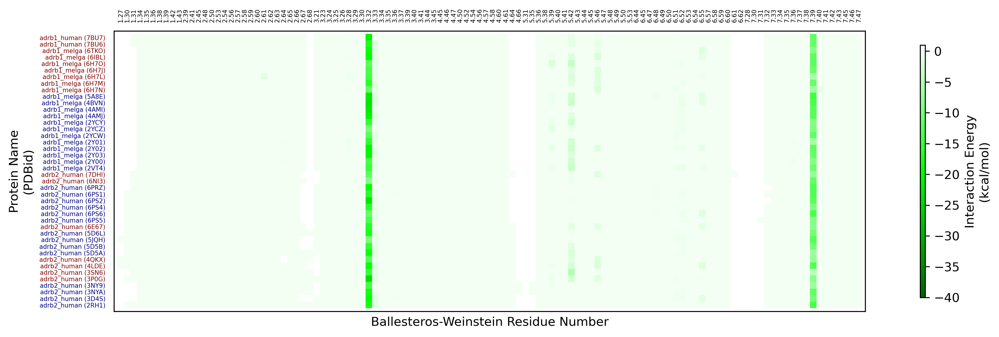

Cluster: 1


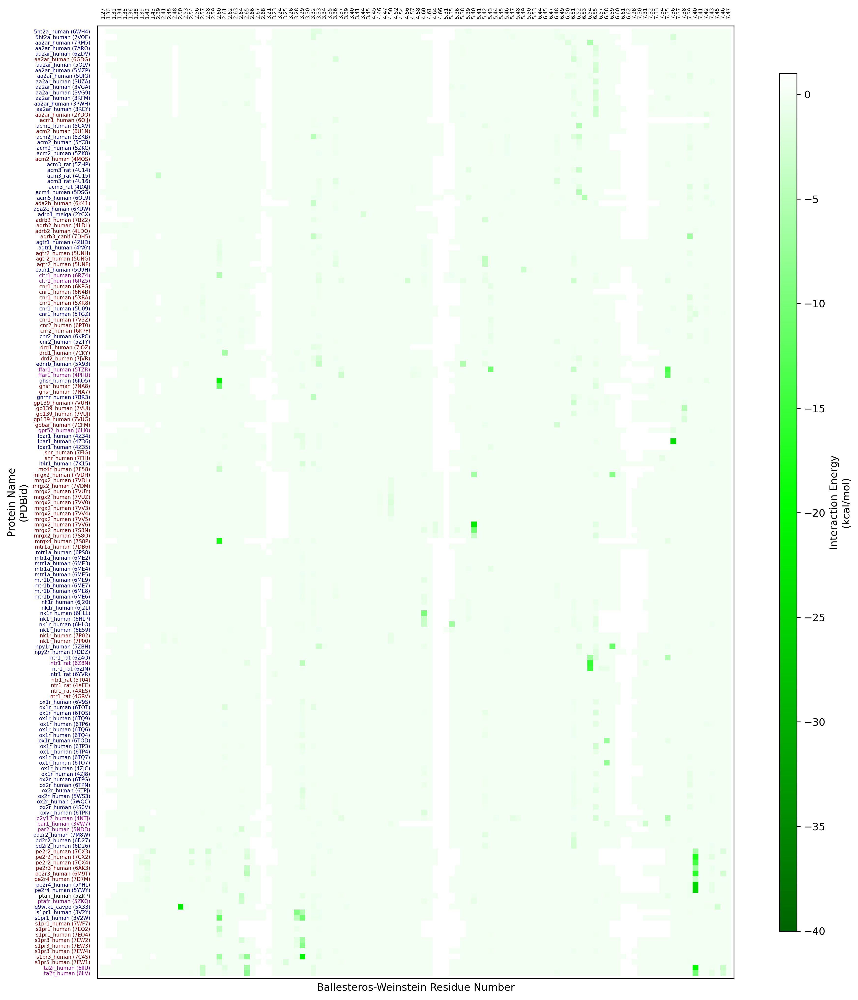

Cluster: 2


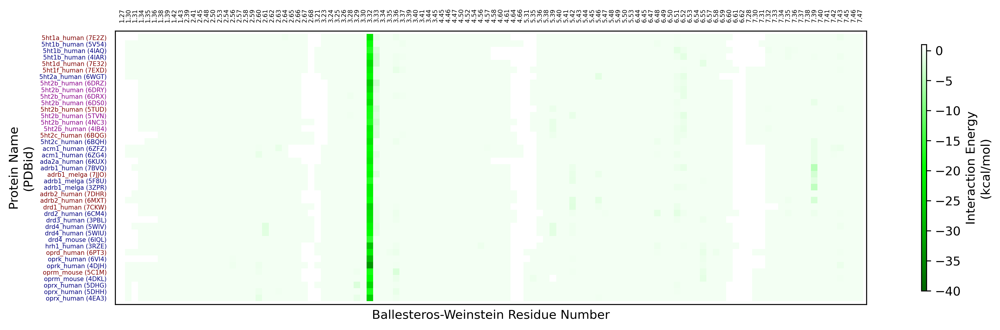

Cluster: 3


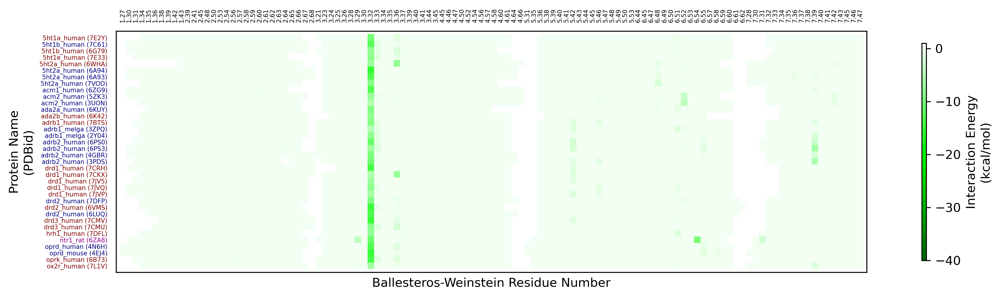

Cluster: 4


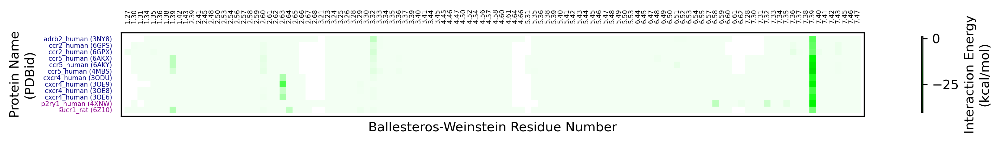

Cluster: 5


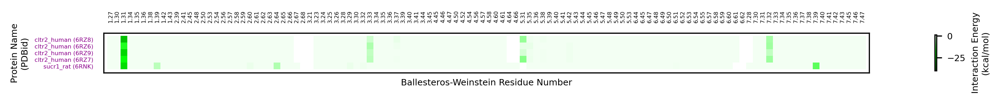

Cluster: 6


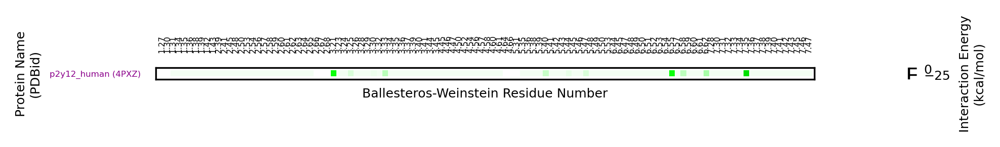

In [440]:
plt.close()
for i in range(len(row_line_markers)):
    x_labels = list(plotX['protein_NPDB'])
    plot_states = list(plotX['states'])
    
    print('Cluster:', i)
    # get data by cluster
    if i == 0:
        sub_X_mat_int = X_mat_int.iloc[0:row_line_markers[i], :]
        sub_x_labels = x_labels[0:row_line_markers[i]]
        sub_plot_states = plot_states[0:row_line_markers[i]]
    elif i == max(range(len(row_line_markers))):
        sub_X_mat_int = X_mat_int.iloc[row_line_markers[i] - 1:, :]
        sub_x_labels = x_labels[row_line_markers[i] - 1:]
        sub_plot_states = plot_states[row_line_markers[i] - 1:]
    else:
        sub_X_mat_int = X_mat_int.iloc[row_line_markers[i-1]:row_line_markers[i], :]
        sub_x_labels = x_labels[row_line_markers[i-1]:row_line_markers[i]]
        sub_plot_states = plot_states[row_line_markers[i-1]:row_line_markers[i]]
    
#     matplotlib.rcParams['figure.figsize'] = [25, 25] #width, height (both in inches)
#     matplotlib.rcParams['figure.dpi'] = 300 #width, height (both in inches)


    # normalization and colormap
    norm = plt.Normalize(-40,1)
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

    # plotting
    fig = plt.figure(figsize=(20,len(sub_X_mat_int) / 10))
    ax = fig.add_subplot(111)
    cax = ax.matshow(sub_X_mat_int, cmap=cmap, norm=norm)
    ratio = X.shape[0]/X.shape[1]
    if len(sub_X_mat_int) < 10:
        plt.yticks(np.arange(len(sub_x_labels)), sub_x_labels, fontsize = 4)
        plt.xticks(np.arange(len(sub_X_mat_int.columns)), plot_int_resnums, fontsize = 3.75, rotation = 90)
        plt.xlabel("Ballesteros-Weinstein Residue Number", fontsize = 6)
        plt.ylabel("Protein Name\n(PDBid)", fontsize = 6)
        plt.ylabel("Protein Name\n(PDBid)", fontsize = 6)
        cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, shrink = 0.9)
        cbar.set_label('Interaction Energy\n(kcal/mol)', rotation=90, fontsize = 6)
        cbar.ax.tick_params(labelsize=6)
    else:
        plt.yticks(np.arange(len(sub_x_labels)), sub_x_labels, fontsize = 5)
        plt.xticks(np.arange(len(sub_X_mat_int.columns)), plot_int_resnums, fontsize = 5, rotation = 90)
        plt.xlabel("Ballesteros-Weinstein Residue Number", fontsize = 10)
        plt.ylabel("Protein Name\n(PDBid)", fontsize = 10)
        cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
        cbar.set_label('Interaction Energy\n(kcal/mol)', rotation=90)
    plt.xlim([-1,len(plot_int_resnums)])
    plt.ylim([-1,len(sub_x_labels)])
    plt.gca().invert_yaxis()

    plt.gca().tick_params(
        axis='both',          # changes apply to both axes
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        left=False,
        right=False,
        labelbottom=False) # labels along the bottom edge are off

    # color tick labels by activation state
    for i in range(len(sub_plot_states)):
        if sub_plot_states[i] == 'Active':
            plt.gca().get_yticklabels()[i].set_color("maroon")
        elif sub_plot_states[i] == 'Inactive':
            plt.gca().get_yticklabels()[i].set_color("navy")
        elif sub_plot_states[i] == 'Intermediate':
            plt.gca().get_yticklabels()[i].set_color("darkmagenta")
        elif sub_plot_states[i] == 'Other':
            plt.gca().get_yticklabels()[i].set_color("black")    

    plt.show()
    plt.close()

In [47]:
ml_df.drop(['cluster_labels'], axis = 1, inplace = True)

# BICLUSTERING

In [213]:
import pickle

# read in filled ml_df for plotting
ml_df = pd.read_pickle('ml_df_filled.pkl')

# keep only intenergysum columns
for col in ml_df.columns:
    if 'intenergysum' not in col:
        ml_df.drop([col], axis = 1, inplace = True)
        
ml_df.fillna(999, inplace = True)
        
display(ml_df)

,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,7EXD_intenergysum,...,6ZA8_intenergysum,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum
0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,...,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,0.0,0.0
1,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,...,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,0.0,0.0
2,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,...,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,0.0,0.0
3,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,...,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,0.0,0.0
4,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,...,999.0,999.0,999.0,999.0,999.0,999.0,0.0,999.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,999.0,999.0,0.0,999.0,0.0,0.0,0.0,999.0,999.0,999.0,...,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0
328,999.0,999.0,0.0,999.0,0.0,0.0,0.0,999.0,999.0,999.0,...,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0
329,999.0,999.0,0.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,...,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0
330,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,...,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0


In [214]:
ml_df.to_csv('ml_df_filled.csv')

In [215]:
X = pd.read_pickle('X_imputed_scaled_allresidues.pkl')
X.columns = ml_df_colnames[1:]
y = pd.read_pickle('y_residues.pkl')

In [216]:
display(X)

,7EW2_intenergysum,7EW2_inttype1,7EW2_intenergy1,7EW2_inttype2,7EW2_intenergy2,7EW3_intenergysum,7EW3_inttype1,7EW3_intenergy1,7EW3_inttype2,7EW3_intenergy2,...,6Z10_intenergysum,6Z10_inttype1,6Z10_intenergy1,6Z10_inttype2,6Z10_intenergy2,6RNK_intenergysum,6RNK_inttype1,6RNK_intenergy1,6RNK_inttype2,6RNK_intenergy2
0,0.117047,-4.551741,0.151104,-3.763468,0.099458,0.089613,-2.89211,0.10593,-3.496811,0.085862,...,0.350445,-6.650852,0.518603,-6.966156,0.511964,0.233533,-6.262522,0.291928,-7.925527,3.555116
1,0.117047,-4.551741,0.151104,-3.763468,0.099458,0.089613,-2.89211,0.10593,-3.496811,0.085862,...,0.350445,-6.650852,0.518603,-6.966156,0.511964,0.233533,-6.262522,0.291928,-7.925527,3.555116
2,0.117047,-4.551741,0.151104,-3.763468,0.099458,0.089613,-2.89211,0.10593,-3.496811,0.085862,...,0.350445,-6.650852,0.518603,-6.966156,0.511964,0.233533,-6.262522,0.291928,-7.925527,3.555116
3,0.117047,-4.551741,0.151104,-3.763468,0.099458,0.089613,-2.89211,0.10593,-3.496811,0.085862,...,0.350445,-6.650852,0.518603,-6.966156,0.511964,0.233533,-6.262522,0.291928,-7.925527,3.555116
4,0.117047,-4.551741,0.151104,-3.763468,0.099458,0.089613,-2.89211,0.10593,-3.496811,0.085862,...,0.350445,-6.650852,0.518603,-6.966156,0.511964,0.233533,-6.262522,0.291928,-7.925527,3.555116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,0.117047,-4.551741,0.151104,-3.763468,0.099458,0.089613,-2.89211,0.10593,-3.496811,0.085862,...,0.138562,-3.520466,0.146999,-4.725967,0.094515,0.140443,-3.405424,0.141795,-5.164405,0.167987
328,0.117047,-4.551741,0.151104,-3.763468,0.099458,0.089613,-2.89211,0.10593,-3.496811,0.085862,...,0.138562,-3.520466,0.146999,-4.725967,0.094515,0.140443,-3.405424,0.141795,-5.164405,0.167987
329,0.117047,-4.551741,0.151104,-3.763468,0.099458,0.089613,-2.89211,0.10593,-3.496811,0.085862,...,0.138562,-3.520466,0.146999,-4.725967,0.094515,0.140443,-3.405424,0.141795,-5.164405,0.167987
330,0.117047,-4.551741,0.151104,-3.763468,0.099458,0.089613,-2.89211,0.10593,-3.496811,0.085862,...,0.138562,-3.520466,0.146999,-4.725967,0.094515,0.140443,-3.405424,0.141795,-5.164405,0.167987


In [217]:
for col in X.columns:
    if 'intenergysum' not in col:
        X.drop([col], axis = 1, inplace = True)

In [218]:
display(X)

,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,7EXD_intenergysum,...,6ZA8_intenergysum,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum
0,0.117047,0.089613,0.183344,0.136516,0.104462,0.111035,0.104368,0.142683,0.110122,0.088134,...,0.154823,0.0,0.0,0.080092,0.080802,0.103387,0.105365,0.094149,0.350445,0.233533
1,0.117047,0.089613,0.183344,0.136516,0.104462,0.111035,0.104368,0.142683,0.110122,0.088134,...,0.154823,0.0,0.0,0.080092,0.080802,0.103387,0.105365,0.094149,0.350445,0.233533
2,0.117047,0.089613,0.183344,0.136516,0.104462,0.111035,0.104368,0.142683,0.110122,0.088134,...,0.154823,0.0,0.0,0.080092,0.080802,0.103387,0.105365,0.094149,0.350445,0.233533
3,0.117047,0.089613,0.183344,0.136516,0.104462,0.111035,0.104368,0.142683,0.110122,0.088134,...,0.154823,0.0,0.0,0.080092,0.080802,0.103387,0.105365,0.094149,0.350445,0.233533
4,0.117047,0.089613,0.183344,0.136516,0.104462,0.111035,0.104368,0.142683,0.110122,0.088134,...,0.154823,0.0,0.0,0.080092,0.080802,0.103387,0.233593,0.094149,0.350445,0.233533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,0.117047,0.089613,4.376378,0.136516,0.410008,0.406673,0.428393,0.142683,0.110122,0.088134,...,0.154823,0.0,0.0,0.080092,0.080802,0.103387,0.105365,0.094149,0.138562,0.140443
328,0.117047,0.089613,4.376378,0.136516,0.410008,0.406673,0.428393,0.142683,0.110122,0.088134,...,0.154823,0.0,0.0,0.080092,0.080802,0.103387,0.105365,0.094149,0.138562,0.140443
329,0.117047,0.089613,4.376378,0.136516,0.104462,0.111035,0.104368,0.142683,0.110122,0.088134,...,0.154823,0.0,0.0,0.080092,0.080802,0.103387,0.105365,0.094149,0.138562,0.140443
330,0.117047,0.089613,0.183344,0.136516,0.104462,0.111035,0.104368,0.142683,0.110122,0.088134,...,0.154823,0.0,0.0,0.080092,0.080802,0.103387,0.105365,0.094149,0.138562,0.140443


In [219]:
from sklearn.cluster import SpectralBiclustering

In [259]:
n_clusters = 10
bi_model = SpectralBiclustering(n_clusters= n_clusters, method="log", random_state=0)
bi_model.fit(X)

SpectralBiclustering(method='log', n_clusters=10, random_state=0)

In [260]:
# labels for residues
bi_model.row_labels_

array([4, 4, 4, 4, 4, 4, 4, 4, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 4, 9, 9, 9, 9,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0,
       7, 0, 0, 0, 0, 0, 0, 1, 4, 4, 4, 4, 4, 5, 0, 0, 0, 0, 0, 0, 0, 6,
       0, 0, 7, 7, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 9, 5,
       5, 5, 0, 0, 0, 3, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 9, 9, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 8, 8, 8, 8, 5, 5,
       5, 5, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7,
       0, 0, 6, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 8, 8, 4, 4,
       4, 4, 5, 5, 5, 5, 5, 5, 5, 2, 0, 0, 0, 0, 0,

In [261]:
# value counts for row labels (residues)
np.unique(bi_model.row_labels_, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 array([182,   1,   1,   2,  89,  23,   2,  11,  13,   8], dtype=int64))

In [262]:
# determine where to place row lines
uniqs = np.unique(bi_model.row_labels_, return_counts=True)
line_count = 0
row_line_markers = []
for i in list(uniqs[1]):
    line_count += i
    row_line_markers.append(line_count)
    print(line_count)
    
print(row_line_markers)

182
183
184
186
275
298
300
311
324
332
[182, 183, 184, 186, 275, 298, 300, 311, 324, 332]


In [263]:
# labels for structures
bi_model.column_labels_

array([8, 8, 9, 8, 8, 8, 8, 8, 3, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 0, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 1,
       8, 9, 9, 9, 9, 8, 8, 0, 8, 0, 8, 8, 8, 8, 9, 8, 9, 9, 8, 0, 8, 8,
       8, 8, 8, 8, 8, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 0, 8, 8, 8, 8, 8,
       8, 8, 8, 7, 0, 6, 8, 8, 9, 9, 9, 6, 5, 8, 8, 9, 9, 8, 0, 8, 8, 8,
       8, 8, 9, 8, 8, 8, 8, 8, 8, 9, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 8, 8, 8, 8, 9, 8,
       8, 8, 9, 8, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9,
       8, 8, 8, 8, 9, 8, 8, 8, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 8,
       9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 8, 8, 8, 9, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 9, 9, 9, 8, 8, 8, 8, 9, 8, 8, 8, 8, 8,

In [264]:
# value counts for column labels (structures)
np.unique(bi_model.column_labels_, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 array([  8,   1,   1,   1,   1,   1,   2,   1, 308,  40], dtype=int64))

In [265]:
# determine where to place column lines
uniqs = np.unique(bi_model.column_labels_, return_counts=True)
line_count = 0
col_line_markers = []
for i in list(uniqs[1]):
    line_count += i
    col_line_markers.append(line_count)
    print(line_count)
    
print(col_line_markers)

8
9
10
11
12
13
15
16
324
364
[8, 9, 10, 11, 12, 13, 15, 16, 324, 364]


In [266]:
PDBids = []
for PDBid in list(X.columns):
    # print(PDBid[0:4])
    PDBids.append(PDBid[0:4])

In [267]:
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap


matplotlib.rcParams['figure.figsize'] = [25, 25] #width, height (both in inches)
matplotlib.rcParams['figure.dpi'] = 600 #width, height (both in inches)
fig = plt.figure(figsize=(25, 25), dpi = 600)

# convert some variables to numpy arrays for sorting
ml_df_np = ml_df.to_numpy()
X_np = X.to_numpy()
PDBids_np = np.array(PDBids)
resnums_np = np.array(resnums)

# Original Dataset Plot
#plt.gcf().set_size_inches(75, 75)
#plt.gcf().set_dpi(300)
norm= plt.Normalize(-40,1)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])
plt.matshow(ml_df, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = plt.colorbar(fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90)
plt.yticks(np.arange(len(y)), resnums, fontsize = 2.5)
plt.xticks(np.arange(len(ml_df.columns)), PDBids, fontsize = 2.5, rotation = 90)

# # Gridlines
# plt.gca().set_xticks([x - 0.5 for x in plt.gca().get_xticks()][1:], minor='true')
# plt.gca().set_yticks([y - 0.5 for y in plt.gca().get_yticks()][1:], minor='true')
# plt.grid(which='minor', color = 'white', linewidth = 0.1)

# for i in range(len(resnums)):
#     plt.axhline(y= i + 0.5, color='white', linestyle='-', linewidth = 0.1)
    
# for i in range(len(PDBids)):
#     plt.axhline(y= i + 0.5, color='white', linestyle='-', linewidth = 0.1)

plt.ylim([-1,len(resnums)])
plt.xlim([-1,len(PDBids)])
plt.gca().invert_yaxis()
plt.title("Original dataset")
plt.savefig('plots/allresidues_biclustering_10clusters_original.png')

plt.show()

# Biclustering Arranged Plot

fit_data = ml_df_np[np.argsort(bi_model.row_labels_)]
fit_data = fit_data[:, np.argsort(bi_model.column_labels_)]

plt.matshow(fit_data, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = plt.colorbar(fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90)
plt.yticks(np.arange(len(y)), list(resnums_np[np.argsort(bi_model.row_labels_)]), fontsize = 2.5)
plt.xticks(np.arange(len(X.columns)), list(PDBids_np[np.argsort(bi_model.column_labels_)]), fontsize = 2.5, rotation = 90)

# column lines
for i in col_line_markers:
     plt.axvline(x = i + 0.5, color='black', linestyle='dashed', linewidth = 0.25)
        
# row lines
for i in row_line_markers:
     plt.axhline(y = i + 0.5, color='black', linestyle='dashed', linewidth = 0.25)


plt.ylim([-1,len(resnums)])
plt.xlim([-1,len(PDBids)])
plt.gca().invert_yaxis()
plt.title("After biclustering; rearranged to show biclusters")
plt.savefig('plots/allresidues_biclustering_10clusters_rearranged.png')

plt.show()

<Figure size 15000x15000 with 0 Axes>

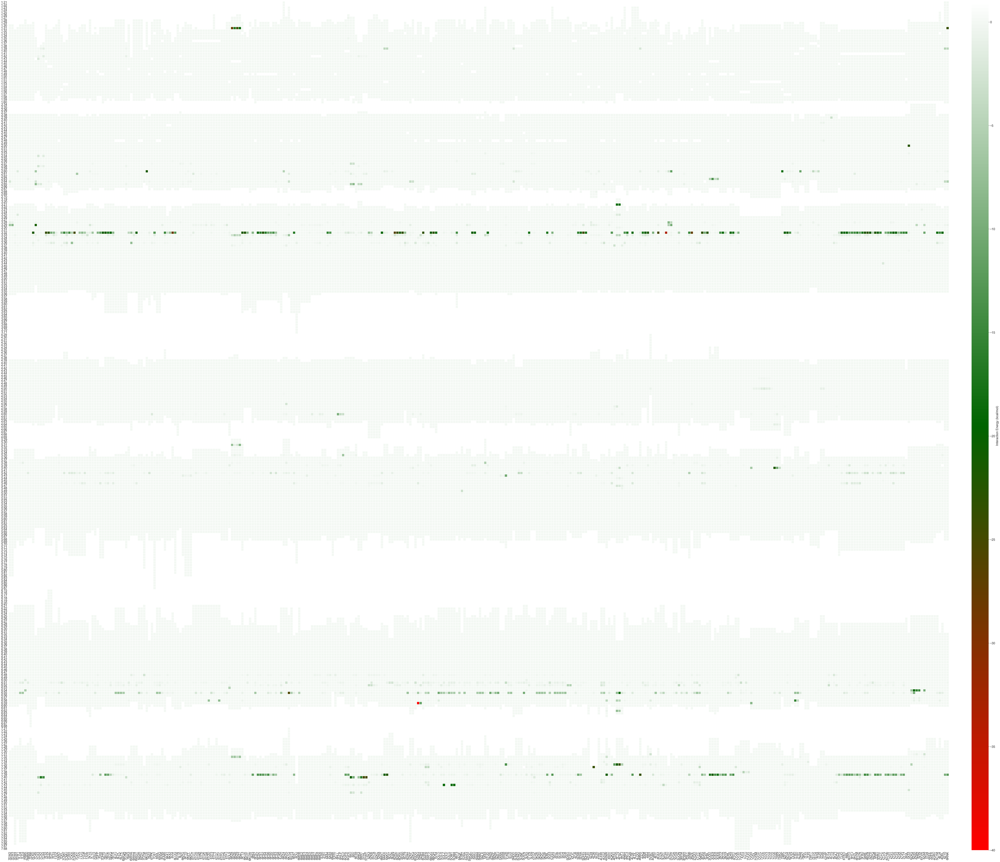

In [137]:
import seaborn as sns
%matplotlib inline
# matplotlib.rcParams['figure.figsize'] = [60, 50] #width, height (both in inches)
# matplotlib.rcParams['figure.dpi'] = 300 #width, height (both in inches)

# get bigger plot
plt.subplots(figsize=(130,100))
norm= plt.Normalize(-40,1)

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","darkgreen","white"])

ax = sns.heatmap(ml_df,
                 cmap = cmap,
                 norm = norm,
                 xticklabels = PDBids,
                 yticklabels = resnums,
                 #linecolor='gray',
                 cbar_kws={'label': 'Interaction Energy (kcal/mol)', "aspect": 50, "pad":0.02},
                 linewidths = 0.05)

sns.set(font_scale = 1.8)
#plt.title('Heatmap of Interaction Energies for each Structure at each Residue Position', fontsize = 20) # title with fontsize 20
#plt.xlabel('Ballesteros-Weinstein Residue Number', fontsize = 20)
#plt.ylabel('Structure PBDid', fontsize = 20)
plt.ylim([0,len(resnums)])
ax.figure.axes[-1].yaxis.label.set_size(20)
plt.gca().invert_yaxis()
plt.show()